In [2]:
import numpy as np
import sympy as sy
import matplotlib.pylab as plt
from IPython.display import clear_output
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import warnings
warnings.filterwarnings('ignore')  
plt.rcParams['text.usetex'] = True
#plt.rcParams['font.size'] = 20
#plt.rcParams['legend.fontsize'] = 30

The **fourth-order Runge-Kutta** algorithm, **RK4**, has proven to be robust and capable of industrial strength work.                                 
It is our recommended approach for solving ODEs.                                                                                 
The algorithm is based upon the formal integral of the differential equation:                                                          
$\qquad\begin{aligned} 
\frac{dx}{dt} &= f(t, x) \\
 x(t) &= \int f(t, x) \ dt \\
 x_{n+1} &= x_n + \int^{t_{n+1}}_{t_n} f(t, x) \ dt 
 \end{aligned}$

The critical idea here is to expand the integrand around the midpoint of the integration interval                            
and thereby obtain $O(h^4)$ precision via the cancellation of the $h$ and $h^3$ terms .                                        
The price paid for the improved precision is having to approximate three derivatives and                                         
the unknown $x$ at the middle of the interval 


We will always use the **4th order Runge-Kutta method**, which in vector form is

$\quad\displaystyle\begin{equation} \mathbf{x}_{n+1} = \mathbf{x}_n + \frac{\mathbf{k}_1 + 2\mathbf{k}_2 + 2\mathbf{k}_3 + \mathbf{k}_4}{6} \end{equation}$

where                                                                                                                               
$\qquad\begin{aligned}
\mathbf{k}_1 &=  \mathbf{f}(\mathbf{t}_n,\mathbf{x}_n) \ \mathrm{dt}  \\
\mathbf{k}_2 &= \mathbf{f}\big(\mathbf{t}_n + \frac{\mathrm{dt}}{2},\mathbf{x}_n + \frac{\mathbf{k}_1}{2}\big) \ \mathrm{dt} \\
\mathbf{k}_3 &= \mathbf{f}\big(\mathbf{t}_n + \frac{\mathrm{dt}}{2},\mathbf{x}_n + \frac{\mathbf{k}_2}{2}\big) \  \mathrm{dt}  \\
\mathbf{k}_4 &= \mathbf{f}\big(\mathbf{t}_n + \mathrm{dt},\mathbf{x}_n + \mathbf{k}_3\big) \  \mathrm{dt} 
\end{aligned}$

In [3]:
def RK4(f, t_span, const, dt, x0):
    t = np.arange(t_span[0], t_span[1], dt)
    x_n = np.zeros((len(t), len(x0)), dtype=float)
    x_n[0] = x0
    
    for i in range(len(t)-1):
        k1 = dt * np.array(f(t[i], x_n[i], const))
        k2 = dt * np.array(f(t[i] + 0.5*dt, x_n[i] + 0.5*k1, const))
        k3 = dt * np.array(f(t[i] + 0.5*dt, x_n[i] + 0.5*k2, const))
        k4 = dt * np.array(f(t[i] + dt, x_n[i] + k3, const))
        x_n[i + 1] = x_n[i] + (k1 + 2*k2 + 2*k3 + k4) / 6
    return t, x_n

## Solve $\dot{x}=x^{−n}$  with $x(0) = 1$.                                                                                                                     
$\displaystyle \begin{aligned}
\text{Let }, \qquad\dot{x} &=x^{-n} \\
\frac{dx}{dt} &=x^{-n} \\
x^{n}{dx} &=dt \\
\text{Now, we can integrate the equation }:\\
\int x^{n}{dx} &= \int dt \\
\frac{1}{n+1}x^{n+1} &= t + C \\
x &=[(n+1)(t+C)]^{1/(n+1)} \\
\text{Now , at }t=0 , \quad x(t=0)=1 \\
1 &=[(n+1)(0+C)]^{1/(n+1)} \\
(1)^{n+1} &=(n+1)(0+C) \\
(n+1)C &=1 \\
 C &=\frac{1}{n+1} \\
\text{So, the Analytic soln. is } \\
x &= \bigg[(n+1) \bigg(t+\frac{1}{(n+1)}\bigg)\bigg]^{1/(n+1)} \\
x &= \bigg[(n+1) t+\frac{(n+1)}{(n+1)}\bigg]^{1/(n+1)} \\
x &= [(n+1)t+1]^{1/(n+1)} \end{aligned}$

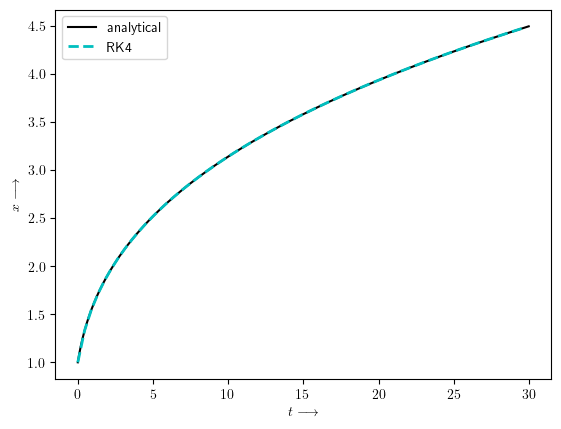

In [3]:
def f(t,x,n):
    return x**(-n)

def analytic_x(t_span, n):
    t = np.arange(t_span[0], t_span[1], 0.01)
    return t,((n+1)*t + 1)**(1/(n+1))

dt = 0.45
t_span = [0, 30]
n = 2
init_cond = [1]
t4,x4 = RK4(f, t_span, n, dt, init_cond)
t,x = analytic_x(t_span, n)
plt.plot(t, x, 'k-', label='analytical')
plt.plot(t4, x4, 'c--', label='RK4', linewidth=2)

plt.xlabel(r'$t \longrightarrow$')
plt.ylabel(r'$x \longrightarrow$')
plt.legend()
plt.show()

A radioactive isotope decays in such a way that the number of atoms present at a given time, $N(t)$, obeys the equation           
$\qquad\displaystyle \frac{dN}{dt}= −\lambda N.$                                                                                           
If there are initially $N_0$ atoms present, find $N(t)$ at later times.

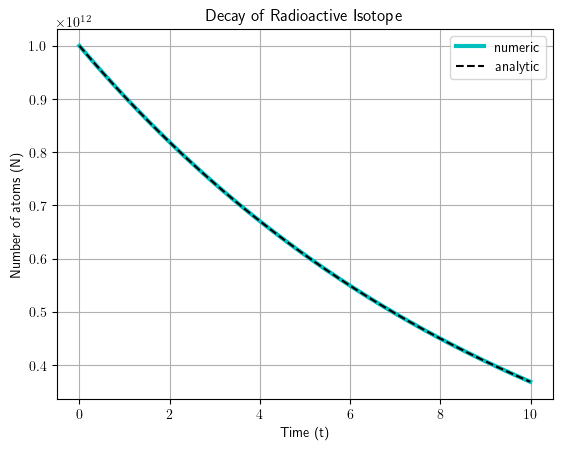

In [4]:
def f(t, N, l):
    return -l*N

def analytic(t, l, N0):
    return N0*np.exp(-l*t)

t_span = [0, 10]  # Time span
dt = 0.01         # Time step
N0 = [1e12]       # Initial number of atoms
l = 0.1           # Decay constant
t, N = RK4(f, t_span, l, dt, N0)

plt.plot(t, N, 'c', lw=3, label='numeric')
plt.plot(t,analytic(t,l,N0),'k--',label='analytic')
plt.xlabel('Time (t)')
plt.ylabel('Number of atoms (N)')
plt.title('Decay of Radioactive Isotope')
plt.legend()
plt.grid(True)
plt.show()

## $$\textbf{Damped Harmonic Oscilltor}$$ 
Various frictional forces may act on a harmonic oscillator, tending to reduce its successive amplitudes.                       
Such a motion is called **damped harmonic motion**.                                                                                
Suppose a particle of mass $m$ is subject to a restoring force proportional to the distance from a fixed point on the $x-$axis                                                                                                                                                    
and a damping force proportional to the velocity.                                                                                         
Then the equation of motion becomes                                                                                                              
## $\qquad\qquad\begin{equation*}  m\ddot{x} = - kx - r\dot{x} \end{equation*}$                                                                                                      
$\qquad x$ being the displacement of the particle from the fixed point at any instant $t, k$ and $r$ are positive constants.                  
The damping force is $-r\dot{x}$ where $r$ is the damping coefficient.                                                                                                                       
<img src="https://raw.githubusercontent.com/Chaks1603/Storage/main/t356_1_026i.jpg" alt="Damped-pendulum" style="float: right; width: 430px; height: 180px;"/>                                                                                                                                                                                                        
                                                                          
Equation (3.1) can be written as                                                                                                                  
## $\qquad\qquad\ddot{x} + 2\beta\dot{x} + \omega^2x = 0$                                                                                                      
 $\qquad$where $2\beta = \frac{r}{m}$ and $\omega=\sqrt{\frac{k}{m}}$ is the natural frequency of the oscillator.                                                         
The relaxation time $\tau$ is defined by $\tau=\frac{1}{2\beta}=\frac{m}{r}$                                                      

In [5]:
def f(t,y,const):
    rhs = [0]*(2)
    w,b = const
    rhs[0] = y[1]
    rhs[1] =  - 2*b*y[1] - w**2*y[0]
    return rhs

In [6]:
m = 1.0                          # mass of particle on a harmonic oscillator
w = 1.0                          # natural angular frequency 
B = [0., 0.2, 0.5, 1.0, 2.5 ]    # damping factor 
dt = 0.1                         # step size
t_span = [0, 30.]                # time space
X0 = [1., 0.]                    # initial conditions of dependent variable 
bl = [r'$\beta=0$', r'$\beta<\omega(\frac{1}{10} C.D.)$ ', 
      r'$\beta<\omega(\frac{1}{2} C.D.)$', r'$\beta=\omega$', r'$\beta>\omega$']
colors = ['c', 'g', 'r', 'm', 'b']

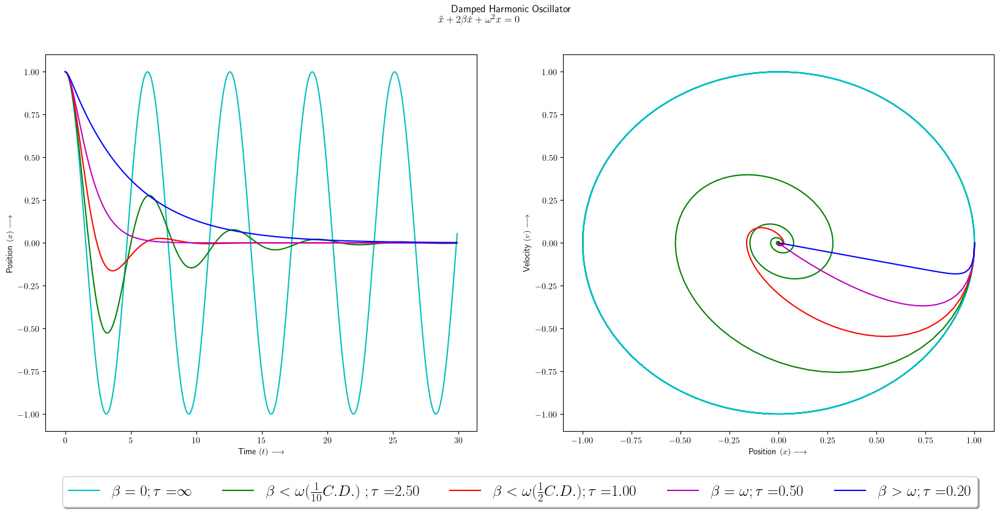

In [7]:
fig = plt.figure(figsize=(20,8))
gs=fig.add_gridspec(1,2)
ax1=fig.add_subplot(gs[0,0])
ax2=fig.add_subplot(gs[0,1])

for i, b in enumerate(B):
    const = w,b
    tRK4, rhsRK4 = RK4(f, t_span, const, dt, X0)
    xxRK4, yyRK4 = rhsRK4[:,0], rhsRK4[:,1]
    
    if b > 0:
        tau = 1 / (2 * b)
        tau_label = r'${:.2f}$'.format(tau)
    else:
        tau_label = r'$\infty$'
        
    ax1.plot(tRK4, xxRK4, label=bl[i] + r'$; \tau=$' + tau_label, color=colors[i])
    ax2.plot(xxRK4, yyRK4, color=colors[i], antialiased=True)

ax1.set_xlabel('Time $(t) \longrightarrow $')
ax1.set_ylabel('Position $(x)  \longrightarrow $')
ax1.set_ylim([-1.1,1.1])
ax1.legend(fontsize=18,loc='upper center', bbox_to_anchor=(1.1, -0.1),  fancybox=True, shadow=True, ncol=5)
ax2.set_xlabel('Position $(x)  \longrightarrow $')
ax2.set_ylabel('Velocity $(v)  \longrightarrow $')
ax2.set_ylim([-1.1,1.1])
fig.suptitle('Damped Harmonic Oscillator' + r'$ \\ \ddot{x} + 2\beta\dot{x} + \omega^2x = 0 $')
plt.show()

## $$\textbf{Forced Harmonic Oscillator }$$ 
Solve **Harmonic Oscillator** with velocity proportional damping $2bv,$ and const. Force $F,m=1 :$                                
$ \displaystyle{\large m\frac{\text{d}^{2}x}{\text{dt}^{2}}+2m\beta\frac{\text{d}x}{\text{dt}}+m\omega_0^{2}x=m\omega^{2}F}$                                                                                    
$ \displaystyle{\large m\frac{\text{d}^{2}x}{\text{dt}^{2}}=m\omega^{2}F-m\omega_0^{2}x-2m\beta\frac{\text{d}x}{\text{dt}}}$                                                                                                                      
$ \displaystyle{=>\large \frac{\text{d}^{2}x}{\text{dt}^{2}}=\omega^{2}F-\omega_0^{2}x-2\beta\frac{\text{d}x}{\text{dt}}}$        
We solve the forced oscillator equation with constant forcing (i.e. driving frequency =0)      
and given initial conditions and plot the various evolutions.

In [8]:
def f(t, X, const):
    w0, b, F0 = const
    w=0.5*w0
    dx1_dt = X[1]
    dx2_dt = F0*w**2 - w0**2*X[0] - 2*b*X[1]
    return np.array([dx1_dt,dx2_dt])

In [9]:
F0=0.11
w0 = 1                          # natural angular frequency 𝜔
B = [0., 0.2, 0.5, 1.0, 2.5 ]   # damping factor b
X0 = [ 0, 0 ]                   # initial conditions of dependent variable 
t_span = [0, 30.]               # time space
bl = [r'$\beta=0$', r'$\beta<\omega(\frac{1}{10} C.D.)$ ', 
      r'$\beta<\omega(\frac{1}{2} C.D.)$', r'$\beta=\omega$', r'$\beta>\omega$']
colors = ['c', 'g', 'r', 'm', 'b']

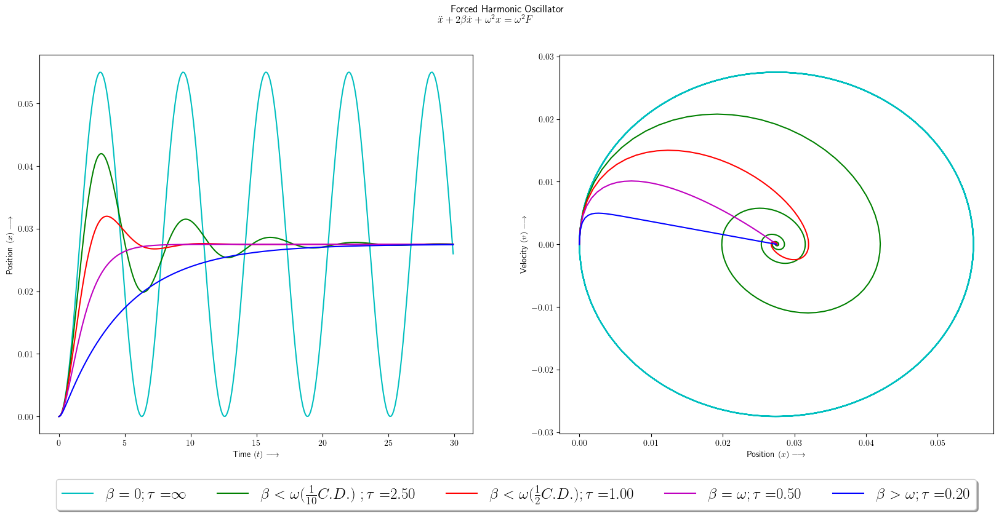

In [10]:
fig = plt.figure(figsize=(20,8))
gs=fig.add_gridspec(1,2)
ax1=fig.add_subplot(gs[0,0])
ax2=fig.add_subplot(gs[0,1])

for i, b in enumerate(B):
    const = w0,b,F0
    tRK4, rhsRK4 = RK4(f, t_span, const, dt, X0)
    xxRK4, yyRK4 = rhsRK4[:,0], rhsRK4[:,1]
    
    if b > 0:
        tau = 1 / (2 * b)
        tau_label = r'${:.2f}$'.format(tau)
    else:
        tau_label = r'$\infty$'
        
    ax1.plot(tRK4, xxRK4, label=bl[i] + r'$; \tau=$' + tau_label, color=colors[i])
    ax2.plot(xxRK4, yyRK4, color=colors[i], antialiased=True)

ax1.set_xlabel('Time $(t) \longrightarrow $')
ax1.set_ylabel('Position $(x)  \longrightarrow $')
ax1.legend(fontsize=18,loc='upper center', bbox_to_anchor=(1.1, -0.1),  fancybox=True, shadow=True, ncol=5)
ax2.set_xlabel('Position $(x)  \longrightarrow $')
ax2.set_ylabel('Velocity $(v)  \longrightarrow $')
fig.suptitle('Forced Harmonic Oscillator' + r'$ \\ \ddot{x} + 2\beta\dot{x} + \omega^2x = \omega^2F $')
plt.show()

## Numerical calulation of Amplitude of 1D driven or forced oscillator :
 
$\qquad\displaystyle{ m{\frac{d^2 x}{dt^2}}+2b{\frac{dx}{dt}}+kx=F \cos (\omega t)}$                                          

$\qquad\displaystyle{ {\frac{d^2 x}{dt^2}}+\underbrace{\frac{2b}{m}}_{= \gamma} {\frac{dx}{dt}}+\underbrace{\frac{k}{m}}_{= \omega_o^2} x= \underbrace{\frac{F}{m}}_{= F_o} \cos (\omega t)}$               
 
$\qquad\displaystyle{ {\frac{d^2 x}{dt^2}}+\gamma{\frac{dx}{dt}}+ {\omega_o^2}x=F_o \cos (\omega t)} $
 
$\qquad\displaystyle{ {\frac{d^2 x}{dt^2}}=-\gamma{\frac{dx}{dt}}-{\omega_o^2}x+F_o \cos (\omega t)} $
 
 where $\displaystyle{\frac{k}{m}={\omega_o^2},\ \frac{F}{m}=F_o} $ and $\displaystyle{\frac{2b}{m}=\gamma},$
 constants to give resonant frequency of about $\frac{1}{s} $

In [11]:
def f(t, y, const):
    m, w, w0, b, f0 = const
    dxdt = y[1]
    dvdt = f0*np.cos(w*t)/m - 2*b*y[1]/m - w0**2*y[0] 
    return np.array([dxdt,dvdt])

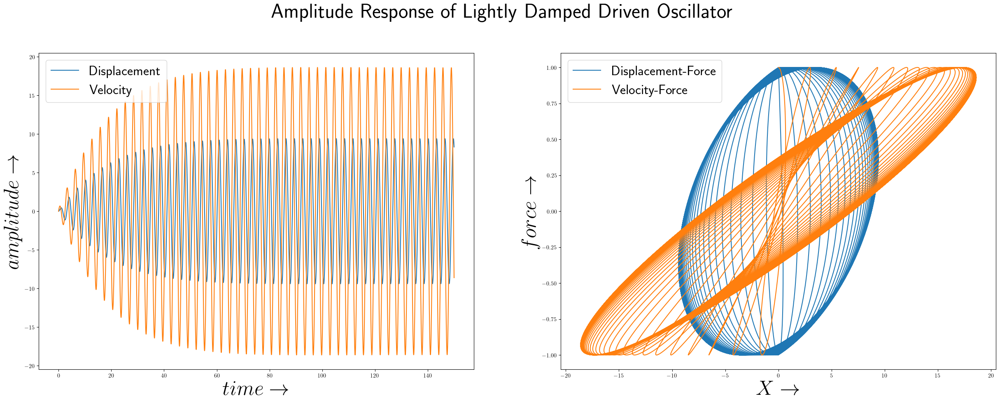

In [12]:
k      = 2.0               # Spring constant
m      = 0.5               # Mass
b      = 0.025             # Damping coefficient
F      = 1.0               # Driving force amplitude
w0     = (k/m)**0.5        # Natural frequency
w      = 0.99 * w0         # Driving frequency
dt     = 0.01              # Time step
t_span = [0, 150]         # Time span for integration
x0     = [0.0, 0.0]        # Initial conditions
t, sol = RK4(f, t_span, [m, w, w0, b, F], dt, x0)
X, V   = sol[:, 0], sol[:, 1] 
FF     = F * np.cos(w * t)

plt.figure(figsize=(30, 10))
plt.suptitle('Amplitude Response of Lightly Damped Driven Oscillator', fontsize=36, y=1.)

# Plot displacement, velocity, and force vs. time together
plt.subplot(1, 2, 1)
plt.plot(t, X, label='Displacement')
plt.plot(t, V, label='Velocity')
#plt.plot(t, FF, label='Force')
plt.legend(fontsize=24)
plt.xlabel(r'$time \rightarrow $', fontsize=36)
plt.ylabel(r'$amplitude \rightarrow $', fontsize=36)

# Plot various phase relationships
plt.subplot(1, 2, 2)
plt.plot(X, FF, label='Displacement-Force')
plt.plot(V, FF, label='Velocity-Force')
plt.xlabel(r'$X \rightarrow $', fontsize=36)
plt.ylabel(r'$force \rightarrow $', fontsize=36)
plt.legend(fontsize=24)
plt.show()

 Plot the response, $x(t)$, of a forced oscillator with a forcing $3 \cos 2t$ and natural frequency $ω_0 = 3$ Hz            
 with initial conditions, $x(0) = 3$ and $ \dot{x} (0) = 0,$ for two different resistances, $β = 1$ and $β = 0.5$. 

 Plot also for fixed resistance, $β = 0.5$ and different forcing amplitudes $f_0 = 1, 3, 5$ and $9.$ 
 
### $\qquad \qquad \displaystyle{ \frac{\text{d}^{2}x}{\text{dt}^{2}}=f_o\cos\omega t-2\beta\frac{\text{d}x}{\text{dt}}-\omega_o^{2}x}$

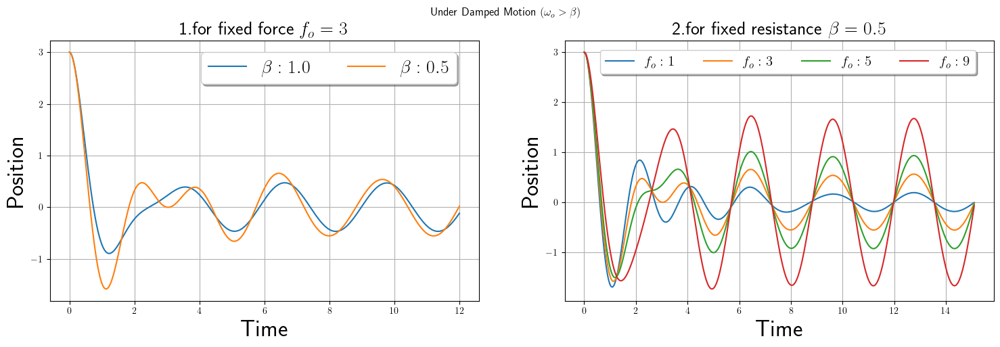

In [13]:
m      = 1
w      = 2
w0     = 3
f0     = 3
X0     = [3,0]
t_span = [0, 15.1]
dt     = 0.01
B      = [1, 0.5]
b      = 0.5
F0     = [1,3,5,9]

fig = plt.figure(figsize=(18,5))
gs=fig.add_gridspec(1,2)
ax1=fig.add_subplot(gs[0,0])
ax2=fig.add_subplot(gs[0,1])

for b in B:
    const = m, w, w0, b, f0
    t1, s = RK4(f, t_span, const, dt, X0)
    x1,v1 = s[:,0],s[:,1]
    ax1.plot(t1[:int(12/dt)],x1[:int(12/dt)],label= r'$ \beta : {:.1f}$'.format(b))

for f0 in F0:
    const = m, w, w0, b, f0
    t2, s = RK4(f, t_span, const, dt, X0)
    x2,v2 = s[:,0],s[:,1]
    ax2.plot(t2,x2,label=f'$f_o : {f0}$')
    
ax1.legend(fontsize=20,loc='upper center', bbox_to_anchor=(0.65, 0.99),fancybox=True, shadow=True, ncol=5)
ax1.grid()
ax1.set_title(r"1.for fixed force $f_o=3$ ",fontsize=20)
ax1.set_xlabel ("Time",size=25)
ax1.set_ylabel ("Position",size=25)
ax2.grid()
ax2.set_title(r"2.for fixed resistance $\beta=0.5$ ",fontsize=20)
ax2.set_xlabel ("Time",size=25)
ax2.set_ylabel ("Position",size=25)
ax2.legend(fontsize=15,loc='upper center', bbox_to_anchor=(0.52, 0.99),fancybox=True, shadow=True, ncol=5)
fig.suptitle(r'Under Damped Motion  $(\omega_o>\beta)$ ')
plt.show()

## $$\textit{Van der Pol Oscillator}$$
Second-order dynamics to coupled first-order: Convert the van der Pol oscillator equation                                       
$\qquad \displaystyle \ddot{x} = 2\mu\dot{x}(1 − \beta x^2)−\omega^2_0 x$                                                              
into a coupled first-order flow. Explore the Poincaré section for the van der Pol oscillator.

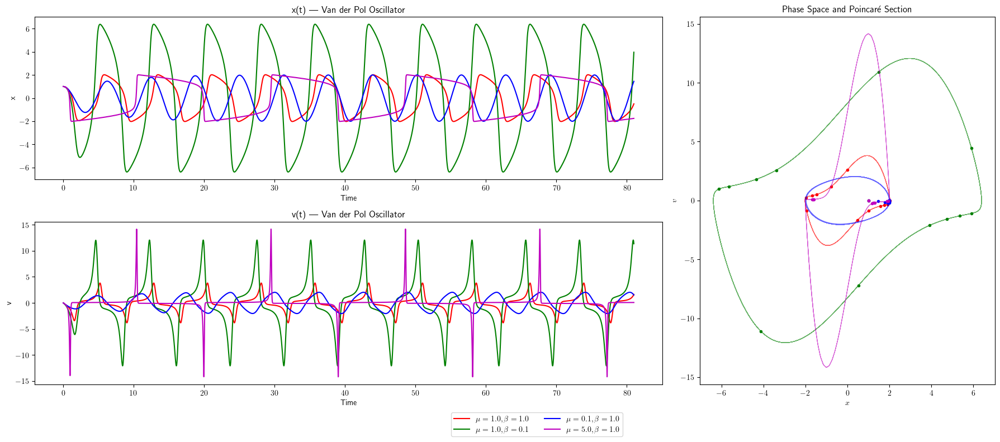

In [29]:
def van_der_pol(t, y, params):
    mu, beta, omega_0 = params
    x1, x2 = y
    dx1_dt = x2
    dx2_dt = 2 * mu * omega_0**2 * x2 * (1 - beta * x1**2) - omega_0**2 * x1
    return [dx1_dt, dx2_dt]

mu_vals = [1.0, 1.0, 0.1, 5.0]
beta_vals = [1.0, 0.1, 1.0, 1.0]
omega_0 = 1.0

y0 = [1.0, 0.0]     # Initial condition: x=1, v=0
t_span = [0.0, 81]  # Total time
dt = 0.01           # Time step
T = 2 * np.pi       # Poincaré strobing interval

fig = plt.figure(figsize=(18, 8))
gs = fig.add_gridspec(2, 3)
ax1 = fig.add_subplot(gs[0, 0:2])  # x(t)
ax2 = fig.add_subplot(gs[1, 0:2])  # v(t)
ax3 = fig.add_subplot(gs[:,   2])  # Phase space + Poincaré
c = ['r', 'g', 'b', 'm']

for i, (m, b) in enumerate(zip(mu_vals, beta_vals)):
    params = (m, b, omega_0)
    t, sol = RK4(van_der_pol, t_span, params, dt, y0)
    x1, x2 = sol[:, 0], sol[:, 1]
    
    ax1.plot(t, x1, color=c[i])
    ax2.plot(t, x2, label=f'$\\mu={m},\\beta={b}$', color=c[i])
    ax3.plot(x1[int(20/dt):], x2[int(20/dt):], lw=0.7, alpha=0.6, color=c[i])

    t_sampled = np.arange(t_span[0], t_span[1], T)
    indices = (t_sampled / dt).astype(int)
    indices = indices[indices < len(t)]

    poincare_x = x1[indices]
    poincare_v = x2[indices]
    ax3.plot(poincare_x, poincare_v, 'o', markersize=3, color=c[i])

ax1.set_xlabel('Time')
ax1.set_ylabel('x')
ax1.set_title('x(t) — Van der Pol Oscillator')

ax2.set_xlabel('Time')
ax2.set_ylabel('v')
ax2.set_title('v(t) — Van der Pol Oscillator')
ax2.legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.8, -0.15), ncol=2)

ax3.set_xlabel(r'$x$')
ax3.set_ylabel(r'$v$')
ax3.set_title('Phase Space and Poincaré Section')

plt.tight_layout()
plt.show()

## $$\textit{Forced Van der Pol Oscillator}$$
Second-order dynamics to coupled first-order: Convert the van der Pol oscillator equation                                       
$\qquad \displaystyle \ddot{x} = F\sin\left(\omega t\right) + 2\mu\dot{x}(1 − \beta x^2)−\omega^2_0 x$                                                              
into a coupled first-order flow. Explore the Poincaré section for the van der Pol oscillator.

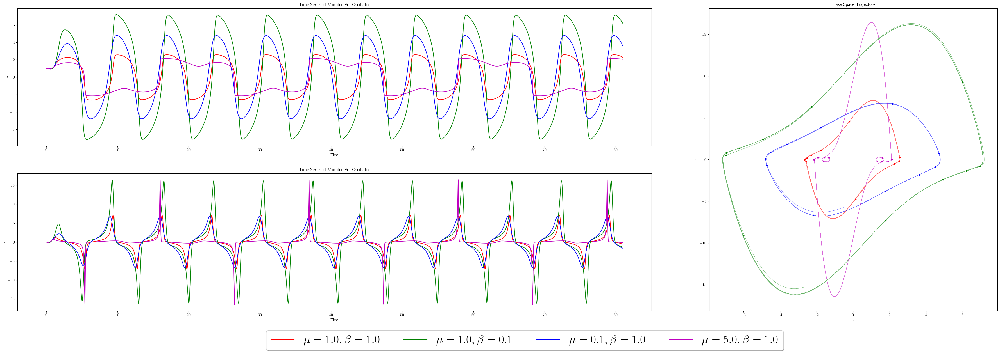

In [7]:
def van_der_pol(t, y, params):
    mu, beta, omega_0, f = params
    x1, x2 = y
    dx1_dt = x2
    dx2_dt = f*np.sin(0.9*omega_0*t) + 2*mu*omega_0**2*x2*(1 - beta * x1**2) - omega_0**2 * x1
    return [dx1_dt, dx2_dt]

mu = [1.0, 1.0, 0.1, 5.0]
beta = [1.0, 0.1, 1.0, 1.0]
omega_0 = 1.0
f = 4.5

y0 = [1.0, 0.0]     # Initial conditions
t_span = [0.0, 81]  # Time span for simulation
dt = 0.01           # Time step
T = 2 * np.pi       # Poincaré strobing interval

fig = plt.figure(figsize=(45,14))
gs=fig.add_gridspec(2,3)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[:,   2])
c = ['r', 'g', 'b', 'm']

for i, (m, b) in enumerate(zip(mu, beta)):
    params = (m, b, omega_0, f)
    t, sol = RK4(van_der_pol, t_span, params, dt, y0)
    x1,x2 = sol[:, 0],sol[:, 1]
    
    ax1.plot(t, x1, color=c[i])
    ax2.plot(t, x2, label=f'$\\mu={m},\\beta={b}$', color=c[i])
    ax3.plot(x1[int(5/dt):], x2[int(5/dt):],lw=0.7, alpha=0.6, color=c[i])
    #ax3.plot(x1, x2,lw=0.7, alpha=0.6, color=c[i])

    t_sampled = np.arange(t_span[0], t_span[1], T)[1:-1]
    indices = (t_sampled / dt).astype(int)
    indices = indices[indices < len(t)] 
    poincare_x,poincare_v = x1[indices],x2[indices]
    ax3.plot(poincare_x, poincare_v, 'o', markersize=3, color=c[i])

ax1.set_xlabel('Time')
ax1.set_ylabel('x')
ax1.set_title('Time Series of Van der Pol Oscillator')

ax2.set_xlabel('Time')
ax2.set_ylabel('v')
ax2.set_title('Time Series of Van der Pol Oscillator')
ax2.legend(fontsize=30,loc='upper center', 
           bbox_to_anchor=(0.8, -0.1),fancybox=True, shadow=True, ncol=5)
    
ax3.set_xlabel(r'$x$')
ax3.set_ylabel(r'$v$')
ax3.set_title('Phase Space Trajectory')

plt.show()

## $$\text{Damped Driven Oscillator} $$

Consider the damped driven pendulum $ \ \displaystyle \ddot{\theta}+2\beta\dot{\theta}+\omega^2_o\sin{\theta} = \gamma\omega^2_o\cos\omega t,$                                                                                                   
a) Starting from any reasonable initial condition, use numerical integration to compute $ \theta(t), \ \dot{\theta}(t)$ .                            
$ \ \ \ $ Show that the time series has an erratic appearance, and interpret it in terms of the pendulum’s motion.                                      
b) Plot the Poincaré section by strobing the system whenever $t=2\pi k,$ where $k$ is an integer.                                       
c) Zoom in on part of the strange attractor found in part (b).                                                                     
$ \ \ \ $ Enlarge a region that reveals the Cantor-like cross section of the attractor.

In [32]:
def damped_driven_pendulum(t, y, params):
    theta, theta_dot = y
    beta, omega_o, gamma, omega = params
    dtheta_dt = theta_dot
    dtheta_dot_dt = -2 * beta * theta_dot - omega_o**2 * np.sin(theta) + gamma * omega_o**2 * np.cos(omega * t)
    return [dtheta_dt, dtheta_dot_dt]

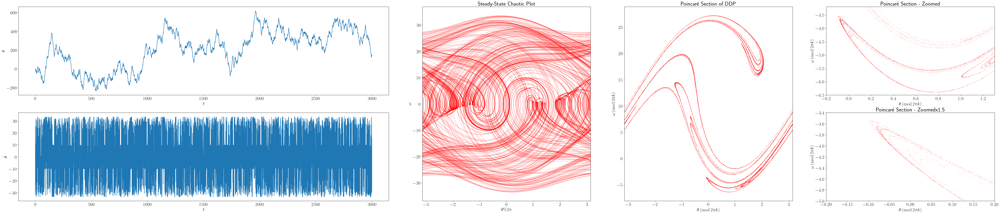

In [39]:
omega   = 2 * np.pi                     # Frequency of the driving force
omega_o = 1.5 * omega                   # Natural frequency
beta    = omega_o / 8                   # Damping coefficient
gamma   = 1.5                           # Amplitude of the driving force
dt      = 0.001                         # Time step
x0      = [0, 0]                        # Initial conditions [theta0, theta_dot0]
params  = [beta, omega_o, gamma, omega]
Tau     = 2 * np.pi / omega

time, solution     = RK4(damped_driven_pendulum, [0, 80000], params, dt, x0)
theta, theta_dot   = solution[:, 0], solution[:, 1]
chaotic_x          = (np.real(theta) - np.pi) % (2*np.pi) - np.pi
indices            = (time / Tau % 1 < dt / Tau)
strobing_theta     = theta[indices]
strobing_theta_dot = theta_dot[indices]
poincare_x         = (np.real(strobing_theta) - np.pi) % (2 * np.pi) - np.pi

fig = plt.figure(figsize=(90, 15))
gs  = fig.add_gridspec(2,6)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[:, 2])
ax4 = fig.add_subplot(gs[:, 3])
ax5 = fig.add_subplot(gs[0, 4])
ax6 = fig.add_subplot(gs[1, 4])

ax1.plot(time[:int(3000/dt)], theta[:int(3000/dt)])
ax1.set_xlabel(r'$t$')
ax1.set_ylabel(r'$\theta$')

ax2.plot(time[:int(3000/dt)], theta_dot[:int(3000/dt)])
ax2.set_xlabel(r'$t$')
ax2.set_ylabel(r'$\dot{\theta}$')

ax3.plot(chaotic_x[int(20 / dt):int(200 / dt)], theta_dot[int(20 / dt):int(200 / dt)], 'r.', ms=0.6)
ax3.set_xlim([chaotic_x.min(), chaotic_x.max()])
ax3.set_title('Steady-State Chaotic Plot')
ax3.set_xlabel(r'$\theta \% 2\pi$')
ax3.set_ylabel(r'$\omega$')

ax4.plot(poincare_x[int(10/dt):], strobing_theta_dot[int(10/dt):], 'r,', ms=0.6)
ax4.set_xlim([poincare_x.min(),poincare_x.max()])
ax4.set_title('Poincaré Section of DDP')
ax4.set_xlabel('$\\theta \\, (\mathrm{mod} \\, 2\pi k)$')
ax4.set_ylabel('$\\omega \\, (\mathrm{mod} \\, 2\pi k)$')

ax5.plot(poincare_x[int(10/dt):], strobing_theta_dot[int(10/dt):], 'r,', ms=0.6)
ax5.set_title('Poincaré Section - Zoomed')
ax5.set_xlabel('$\\theta \\, (\mathrm{mod} \\, 2\pi k)$')
ax5.set_ylabel('$\\omega \\, (\mathrm{mod} \\, 2\pi k)$')
ax5.set_xlim([-0.2, 1.3])
ax5.set_ylim([-6.5,-3.2])

ax6.plot(poincare_x[int(10/dt):], strobing_theta_dot[int(10/dt):], 'r,', ms=0.6)
ax6.set_title('Poincaré Section - Zoomedx1.5')
ax6.set_xlabel('$\\theta \\, (\mathrm{mod} \\, 2\pi k)$')
ax6.set_ylabel('$\\omega \\, (\mathrm{mod} \\, 2\pi k)$')
ax6.set_xlim([-0.2, 0.2])
ax6.set_ylim([-5.0,-3.4])    
plt.show()

Consider the forced pendulum $\qquad\qquad\qquad\qquad\qquad\qquad\qquad\qquad\quad$    (Chaos in the damped driven pendulum)                                                                                                              
$\qquad \ddot{\theta}+b\dot{\theta}+\sin{\theta} = F \cos t,$ with $b=0.22,F=2.7$ (Grebogi et al. 1987).                                
a) Starting from any reasonable initial condition, use numerical integration to compute $\dot{\theta}(t)$ .                            
$ \ \ \ $ Show that the time series has an erratic appearance, and interpret it in terms of the pendulum’s motion.                                      
b) Plot the Poincaré section by strobing the system whenever $t=2\pi k,$ where $k$ is an integer.                                       
c) Zoom in on part of the strange attractor found in part (b).                                                                     
$ \ \ \ $ Enlarge a region that reveals the Cantor-like cross section of the attractor.

In [28]:
def damped_driven_oscillator(t, y, const):
    b, F = const
    theta, theta_dot = y
    dtheta_dt = theta_dot
    dtheta_dot_dt = -b * theta_dot - np.sin(theta) + F * np.cos(t)
    return np.array([dtheta_dt, dtheta_dot_dt])

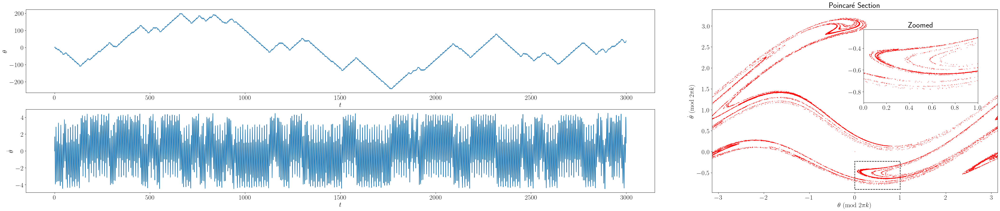

In [31]:
theta0 = 0.0      # initial angle
theta_dot0 = 0.0  # initial angular velocity
x0 = [theta0, theta_dot0]
dt = 0.001
b  = 0.22
F  = 2.7
T  = 2*np.pi
time, solution      = RK4(damped_driven_oscillator, [0, 20000*T], [b, F], dt, x0)
theta, theta_dot    = np.real(solution[:, 0]), np.real(solution[:, 1])
indices             = (time / T % 1 < dt / T)
thetasG,theta_dotsG = theta[indices], theta_dot[indices]
poincare_xG         = (thetasG - np.pi) % (2 * np.pi) - np.pi

fig = plt.figure(figsize=(90, 10))
gs  = fig.add_gridspec(2, 5)
ax1 = fig.add_subplot(gs[0, 0:2])
ax2 = fig.add_subplot(gs[1, 0:2])
ax3 = fig.add_subplot(gs[:, 2])

ax1.plot(time[:int(3000/dt)], theta[:int(3000/dt)])
ax1.set_xlabel(r'$t$')
ax1.set_ylabel(r'$\theta$')
ax2.plot(time[:int(3000/dt)], theta_dot[:int(3000/dt)])
ax2.set_xlabel(r'$t$')
ax2.set_ylabel(r'$\dot{\theta}$')

ax3.plot(poincare_xG, theta_dotsG, 'r.', markersize=1)
ax3.set_xlim([poincare_xG.min(), poincare_xG.max()])
ax3.set_title('Poincaré Section')
ax3.set_xlabel(r'$ \theta \ (\mathrm{ mod } \ 2\pi k)$')
ax3.set_ylabel(r'$ \dot{\theta} \ (\mathrm{ mod } \ 2\pi k)$')
rect = plt.Rectangle((0, -0.9), 1, 0.672, linewidth=1.5, edgecolor='black', facecolor='none', linestyle='--')
ax3.add_patch(rect)

ax4 = inset_axes(ax3, width="40%", height="40%", loc='upper right', borderpad=2)
ax4.plot(poincare_xG, theta_dotsG, 'r.', markersize=1)
ax4.set_xlim([0, 1])
ax4.set_ylim([-0.9, -0.228])
ax4.set_title('Zoomed')
plt.show()

(Fractal basin boundaries in the damped driven pendulum)                                                                           
Consider the pendulum of the previous exercise, but now let $b = 0.2, F = 2$ (Grebogi et al. 1987).                                     
  a. Show that there are two stable fixed points in the Poincaré section.                                                               
   Describe the corresponding motion of the pendulum in each case.                                                                             
  b. Compute the basins for each fixed point.                                                                                       
   Use a reasonably fine grid of initial conditions, and then integrate from each one until the trajectory has settled down to one of the fixed points.                                                                                                          
(You’ll need to establish a criterion to decide whether convergence has occurred.)                                                 
Show that the boundary between the basins looks like a fractal.

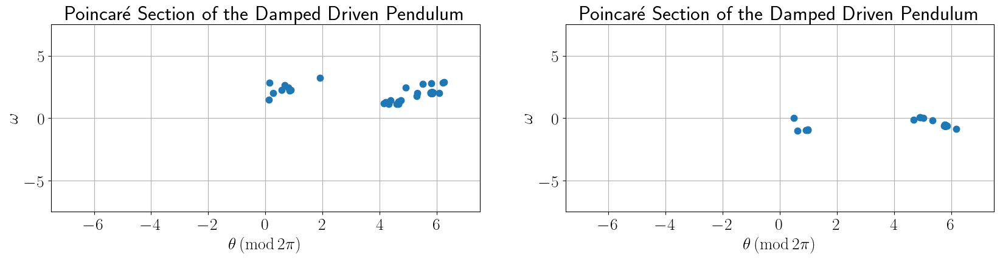

In [14]:
b          = 0.2
F          = 2.0
theta0     = [5, 0.5]  # initial angle
theta_dot0 = [10, 0.0]  # initial angular velocity
dt         = 0.01
T          = 2 * np.pi

fixed_points_theta     = []
fixed_points_theta_dot = []

fig, ax = plt.subplots(1, len(theta0), figsize=(20, 4))
for i in range(len(theta0)):
    x0 = [theta0[i], theta_dot0[i]]
    t, s = RK4(damped_driven_pendulum, [0, 8000], [b, F], dt, x0)
    theta, theta_dot = s[:, 0], s[:, 1]
    indices = (t / T % 1 < dt / T)
    thetas = theta[indices]
    theta_dots = theta_dot[indices]
    thetas = np.asarray(thetas, dtype=np.float64)

    fixed_points_theta.append(thetas % T)
    fixed_points_theta_dot.append(theta_dots)
    
    # Plotting the Poincaré section
    ax[i].plot(thetas % T, theta_dots, '.', markersize=15)
    ax[i].set_title('Poincaré Section of the Damped Driven Pendulum')
    ax[i].set_xlabel('$\\theta \\, (\\mathrm{mod} \\, 2\\pi)$')
    ax[i].set_ylabel('$\\omega$')
    ax[i].grid(True)
    ax[i].set_xlim(-7.5, 7.5)
    ax[i].set_ylim(-7.5, 7.5)

plt.show()

fixed_points_theta = np.concatenate(fixed_points_theta)
fixed_points_theta_dot = np.concatenate(fixed_points_theta_dot)
fixed_points = []
for f1,f2 in zip(fixed_points_theta,fixed_points_theta_dot):
    fixed_points.append([f1,f2])
fixed_points = np.real(np.array(fixed_points))

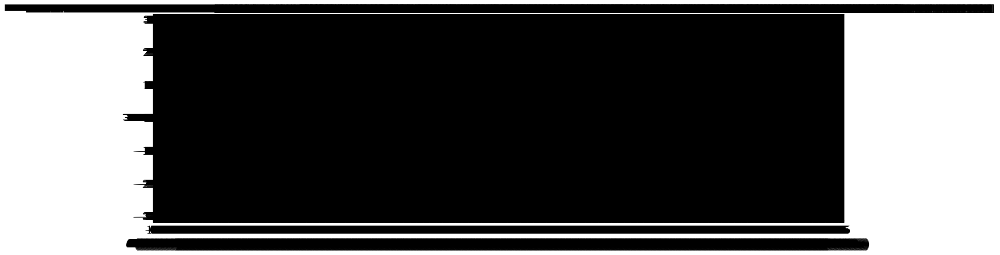

In [19]:
fig, ax = plt.subplots(1, len(fixed_points), figsize=(20, 6))
for i in range(len(fixed_points)):
    theta0, omega0 = fixed_points[i]
    x0 = [theta0, omega0]
    t, s = RK4(damped_driven_pendulum, [0, 100], [b, F], dt, x0)
    theta, omega = s[:, 0], s[:, 1]
   
    ax[i].plot(theta, omega, '-', markersize=15)
    ax[i].set_title(f'Fixed points correspond to period motion of the pendulum {fixed_points[i]}', fontsize=14)
    ax[i].set_xlabel('$\\theta \\, (\\mathrm{mod} \\, 2\\pi)$')
    ax[i].set_ylabel('$\\omega$')
    ax[i].grid(True)
    
    if len(x) > i:
        ax[i].set_xlim(x[i])
    else:
        ax[i].set_xlim(-2*np.pi, 2*np.pi)  # Example default limits
    
    ax[i].set_ylim(-T/2, T/2)
plt.show()

---

## $ \qquad\qquad\displaystyle\ddot{x}+\beta\dot{x}+x-x^2=F\sin\left(\omega t + \phi \right)$

Attension throughout on phase $\phi=180^{\circ} ,$ achieving this by the simple expedient of immediately replacing $F$ by $-F$

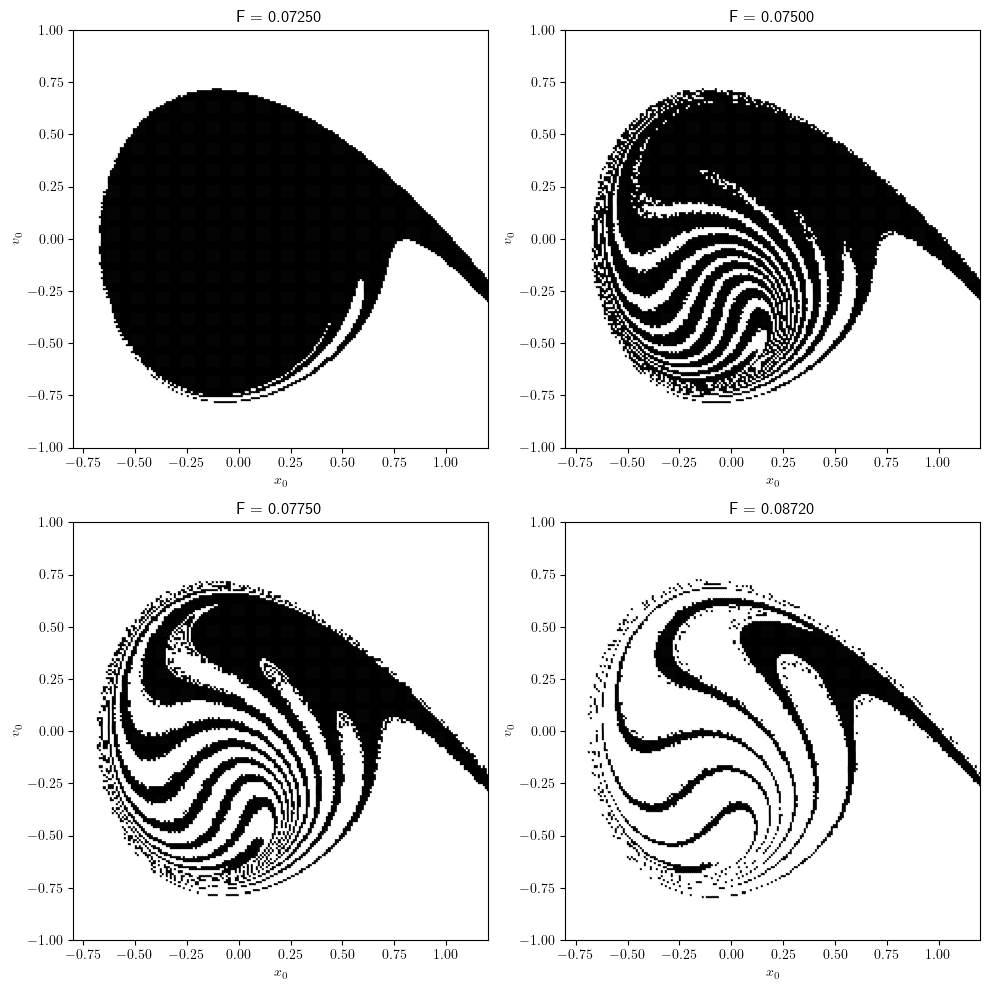

In [3]:
def thompsons(t, state, const):
    beta, F, omega = const
    x, v = state
    dxdt = v
    dvdt = -beta * v - x + x**2 - F * np.sin(omega * t)
    return np.array([dxdt, dvdt])

def is_escaped(trajectory, escape_radius=10):
    x_vals = trajectory[:, 0]
    return np.any(np.abs(x_vals) > escape_radius)      # Check if the trajectory escapes

def basin_erosion(beta, omega, F_values, x0_range, v0_range, t_span, dt, escape_radius=10, grid_size=100):
    x0_vals = np.linspace(*x0_range, grid_size)
    v0_vals = np.linspace(*v0_range, grid_size)
    basin_data = {}
    for F in F_values:
        x_data, v_data, colors = [], [], []
        for x0 in x0_vals:
            for v0 in v0_vals:       
                _, trajectory = RK4(thompsons, t_span, (beta, F, omega), dt, [x0, v0])
                escaped = is_escaped(trajectory, escape_radius)
                x_data.append(x0)
                v_data.append(v0)
                colors.append("white" if escaped else "black")  # Red for escaped, Blue for trapped
        basin_data[F] = (x_data, v_data, colors)
    return basin_data

beta = 0.1
omega = 0.850
t_span =[0,200]
dt = 0.1
F_values = [0.0725, 0.075, 0.0775, 0.0872]  # Sequence of forcing amplitudes
x0_range = (-0.8, 1.2)
v0_range = (-1, 1)
basin_data = basin_erosion(beta, omega, F_values, x0_range, v0_range, t_span, dt, grid_size=200)

fig = plt.figure(figsize=(10,10))    
for idx, (F, (x_data, v_data, colors)) in enumerate(basin_data.items()):
    ax = fig.add_subplot(2,2, idx+1)
    ax.scatter(x_data, v_data, marker= ',', c=colors, s=1, alpha=1)  # Small dots for high resolution
    ax.set_title(f"F = {F:.5f}")
    ax.set_xlabel("$x_0$")
    ax.set_ylabel("$v_0$")
    ax.set_xlim(x0_range)
    ax.set_ylim(v0_range)

plt.tight_layout()
plt.show()

$$\textbf{Duffing attractor }$$ 

Consider the system $ \displaystyle \ddot{x}+\delta\dot{x}-\beta x+x^3 = F \cos \omega t $ for different sets of values.                                              
Show numerically that the system has a strange attractor, and plot its Poincaré section.                                              

In [3]:
def duffing(t, y, const):
    f, d, b, w = const
    x, v = y
    dxdt = v
    dvdt = f*np.cos(w*t) - d*v + b*x - x**3 
    return np.array([dxdt, dvdt])

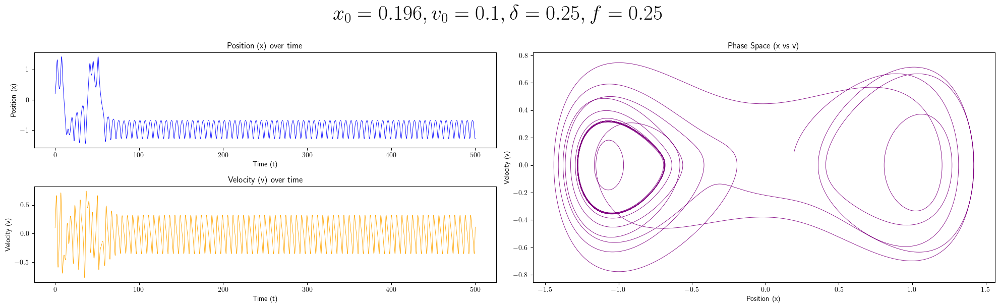

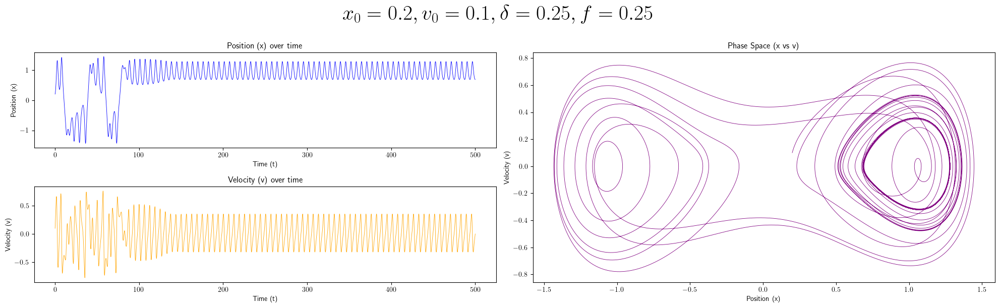

In [4]:
f = 0.25
w = 1
d = 0.25
b = 1
dx_0  = 0.1
dt    = 0.001
T  = 500000
t_span = [0, T*dt]

for x_0 in [0.196, 0.2]:
    t, sol = RK4 ( duffing, t_span, (f, d, b, w), dt, [x_0, dx_0] )
    x, v = sol[:,0], sol[:,1]
    
    fig = plt.figure(figsize=(20,6))
    gs=fig.add_gridspec(2,4)
    ax1=fig.add_subplot(gs[0,0:2])
    ax2=fig.add_subplot(gs[1,0:2])
    ax3=fig.add_subplot(gs[:,2:4])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]}, \delta={d}, f={f}$', fontsize=30, y=1.01)
        
    ax1.plot(t, x, lw=0.6, color='blue')
    ax1.set_title("Position (x) over time")
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t, v, lw=0.6, color='orange')
    ax2.set_title("Velocity (v) over time")
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x, v, lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
        
    plt.tight_layout()
plt.show()                                        

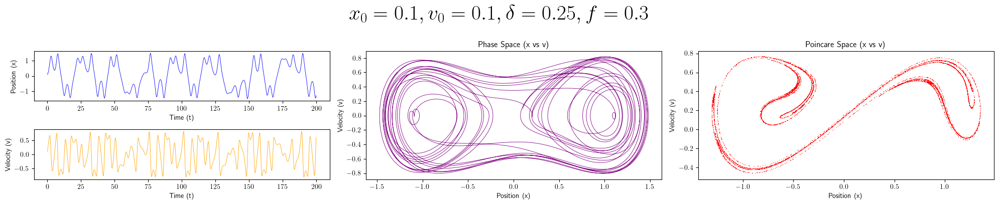

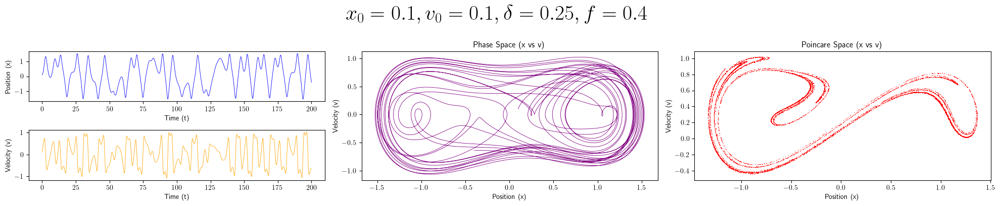

In [5]:
w  = 1
d  = 0.25
b  = 1
v0 = 0.1
x0 = 0.1
dt = 0.01
T  = 8000000
period = 2*np.pi/w

for f in [0.3, 0.4]:
    t, sol = RK4( duffing, [0, T*dt], (f, d, b, w), dt, [x0, v0] )
    x, v = sol[:,0], sol[:,1]
    ts = np.abs((t % period) - period ) < dt 

    fig = plt.figure(figsize=(20,4))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]}, \delta={d}, f={f}$', fontsize=30, y=1.01)
        
    ax1.plot(t[:20000], x[:20000], lw=0.6, color='blue')
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t[:20000], v[:20000], lw=0.6, color='orange')
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x[:20000], v[:20000], lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
    
    ax4.plot(x[ts], v[ts],'r,',ms=0.4)
    ax4.set_title("Poincare Space (x vs v)")
    ax4.set_xlabel("Position (x)") 
    ax4.set_ylabel("Velocity (v)")
    plt.tight_layout()
plt.show()                                        

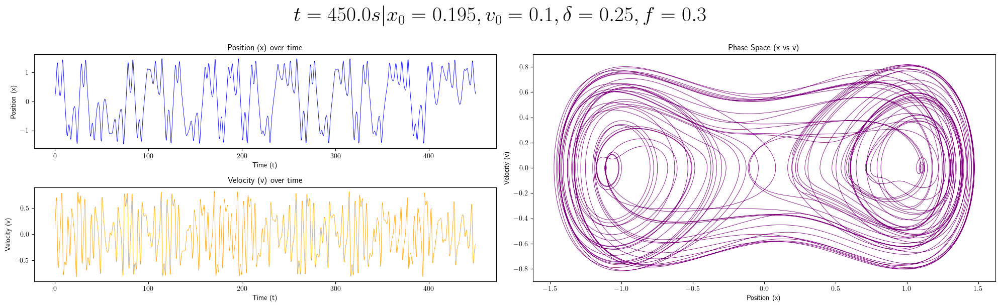

In [5]:
w = 1
d = 0.25
b = 1
f = 0.3
dx_0  = 0.1
x_0   = 0.195
dt    = 0.01
T  = 50000
t_span = [0, T*dt]

t, sol = RK4( duffing, t_span, (f, d, b, w), dt, [x_0, dx_0] )
x, v = sol[:,0], sol[:,1]

for n in range(46000):
    if n % 1000 == 0:
        clear_output(wait=True)
        fig = plt.figure(figsize=(20,6))
        gs=fig.add_gridspec(2,4)
        ax1=fig.add_subplot(gs[0,0:2])
        ax2=fig.add_subplot(gs[1,0:2])
        ax3=fig.add_subplot(gs[:,2:4])
        fig.suptitle(f'$t={n*dt}s | x_0={x[0]}, v_0={v[0]}, \delta={d}, f={f}$', fontsize=30, y=1.01)
        
        ax1.clear()
        ax1.plot(t[:n], x[:n], lw=0.6, color='blue')
        ax1.set_title("Position (x) over time")
        ax1.set_xlabel("Time (t)")
        ax1.set_ylabel("Position (x)")
                
        ax2.clear()
        ax2.plot(t[:n], v[:n], lw=0.6, color='orange')
        ax2.set_title("Velocity (v) over time")
        ax2.set_xlabel("Time (t)")
        ax2.set_ylabel("Velocity (v)")
        
        ax3.clear()
        ax3.plot(x[:n], v[:n], lw=0.6, color='purple')
        ax3.set_title("Phase Space (x vs v)")
        ax3.set_xlabel("Position (x)")
        ax3.set_ylabel("Velocity (v)")
        
        plt.tight_layout()
        plt.show()                                        

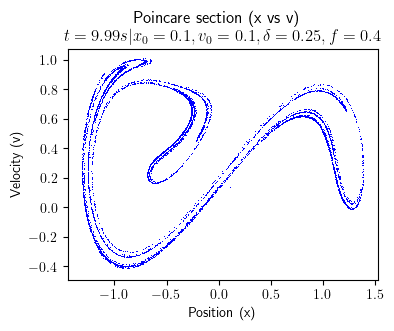

In [11]:
dt = 0.01
w  = 1
f  = 0.4
d  = 0.25
b  = 1
T  = 5000000
x0 = 0.1
v0 = 0.1
tS = [0, T*dt]

t, sol = RK4( duffing, tS, (f, d, b, w), dt, [x0, v0] )
x, v = sol[:,0], sol[:,1]

for n in range(1000):
    
    ts = abs((t + n/100 * 2*np.pi) % (2*np.pi)) < dt
    
    clear_output(wait=True)
    plt.figure(figsize=(4,3))
    plt.clf() 
    plt.plot(x[ts], v[ts], 'b,', lw=0.2)   
    plt.suptitle("Poincare section (x vs v)", y=1.01)
    plt.title(f'$t={n*dt:.2f}s | x_0={x[0]}, v_0={v[0]}, \delta={d}, f={f}$')
    plt.xlabel("Position (x)")
    plt.ylabel("Velocity (v)")
    plt.show() 

(Basins for the unforced oscillator)                                                                                       
Sketch the basins for the weakly damped double-well oscillator (12.5.1) in the unforced case when $F=0$.                   
How does their shape depend on the size of the damping? What happens to the basins as the damping tends to zero?           
What implications does this have for the predictability of the unforced system?                                             

The basins become thinner as the damping decreases, and they appear to wrap around each other more and more as $\delta\rightarrow 0$ (tends to zero).                                                                                         
This will make for sensitive dependence on initial conditions, which means that accurate prediction of which basin an initial condition will settle                                                                                             
into is virtually impossible unless the initial condition is practically settled into one of the basins already.

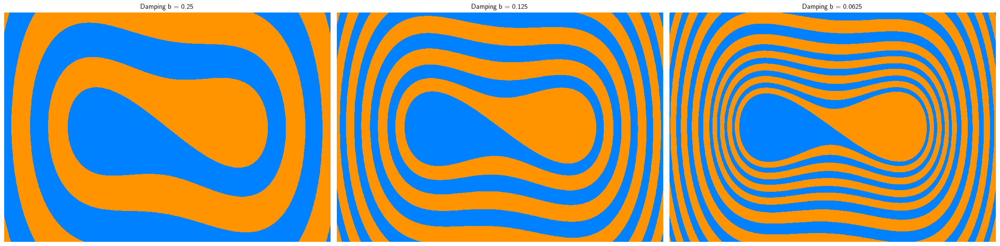

In [6]:
dt = 0.01
w  = 1
F  = 0.0
B  = [0.25, 0.125, 0.0625]
T  = int(5 * 2 * np.pi / dt)
x  = np.linspace(-2.5, 2.5, 1000)
y  = np.linspace(-2.5, 2.5, 1000)
xr, vr = np.meshgrid(x, y)  

fig, axes = plt.subplots(1, len(B), figsize=(24, 6))
for i, b in enumerate(B):
    x_temp = xr.copy()
    v_temp = vr.copy()
    for n in range(T):
        t = n * dt
        dx, dv = duffing(t, [x_temp, v_temp], const=[F, b, w]) 
        x_temp += dx * dt 
        v_temp += dv * dt

    axes[i].contourf(x_temp>0, levels=[-2.5,0,2.5], cmap='jet')     
    axes[i].set_title(f"Damping b = {b}")
    axes[i].set_xlabel("Position (x)")
    axes[i].set_ylabel("Velocity (v)")
    axes[i].axis(False)
plt.tight_layout()
plt.show()

(Basins for the forced oscillator)                                                                                       
Sketch the basins for the weakly damped double-well oscillator (12.5.1) in the forced case when $F=0.25, \omega=1, \delta=0.25$.          

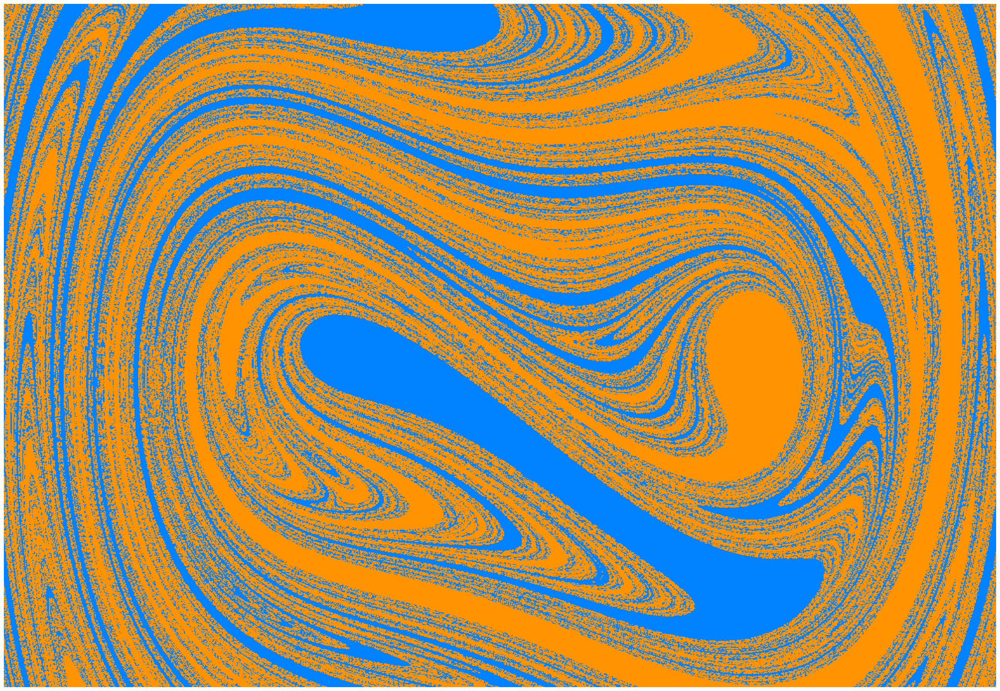

In [7]:
dt = 0.01
w  = 1
F  = 0.25
b  = 0.25
T  = int( 73 * 2*np.pi/dt + 1)
xr = np.linspace(-2.5,2.5,1000)
yr = np.linspace(-2.5,2.5,1000)
x, v = np.meshgrid(xr, yr)

for n in range(T-1):
    a = F*np.cos(w*n*dt) - b*v + x - x**3
    v = v + a*dt
    x = x + v*dt
    if n % 10 == 0:
        clear_output(wait=True)
        plt.figure(figsize=(26,18))
        plt.contourf(x>0, level=[-2.5,0,2.5], cmap='jet')
        plt.axis(False)
        plt.tight_layout()
        plt.show()

$$\textbf{Ueda attractor }$$ 
Consider the system $\displaystyle{\ddot{x} + k\dot{x} + x^3 = B \cos t,}$ with $k = 0.1, B = 12.$                             
Show numerically that the system has a strange attractor, and plot its Poincaré section.                                              

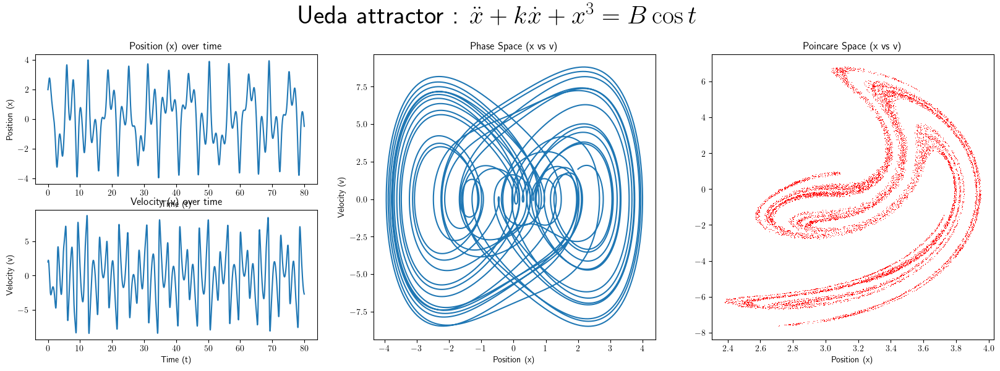

In [6]:
def ueda(t, y, const):                        
    k, B = const             
    dx_dt = y[1]        
    dv_dt = -k*y[1] - y[0]**3 + B*np.cos(t)    
    return np.array([dx_dt, dv_dt])

k = 0.1
B = 12
w = 0.1
x0 = [2,2]
dt = 0.01
t_max = 800000 
period = 2 * np.pi / w

t, sol = RK4(ueda, [0, t_max], (k, B), dt, x0)
x, v = sol[:, 0], sol[:, 1]
ts = np.abs((t % period) - period ) < dt 

fig = plt.figure(figsize=(20,6))
gs = fig.add_gridspec(2, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])
ax4 = fig.add_subplot(gs[:, 2])
fig.suptitle('Ueda attractor'+r' : $ \ddot{x} + k\dot{x} + x^3 = B \cos t $', fontsize=30, y=1.01)

ax1.plot(t[:8000], x[:8000])
ax1.set_title("Position (x) over time")
ax1.set_xlabel("Time (t)")
ax1.set_ylabel("Position (x)")

ax2.plot(t[:8000], v[:8000])
ax2.set_title("Velocity (v) over time")
ax2.set_xlabel("Time (t)")
ax2.set_ylabel("Velocity (v)")

ax3.plot(x[:8000], v[:8000])
ax3.set_title("Phase Space (x vs v)")
ax3.set_xlabel("Position (x)")
ax3.set_ylabel("Velocity (v)")

ax4.plot(x[ts], v[ts],'r,',ms=0.4)
ax4.set_title("Poincare Space (x vs v)")
ax4.set_xlabel("Position (x)")
plt.show()

$$\textbf{Ueda - Duffing attractor }$$ 
Consider the system $\displaystyle{\ddot{x} + k\dot{x} + x^3 = B_0 + B_1 \cos t,}$ with $k = 0.05, \begin{equation*} B_0 = \left\{\begin{array}{rl} 0.030  \\  0.045 \end{array} \right.\end{equation*}, B_1 = 0.16$                              
Show numerically that the system has a strange attractor, and plot its Poincaré section.                                              

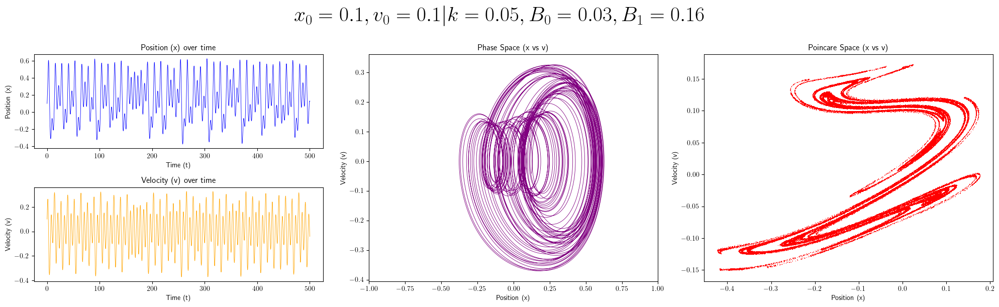

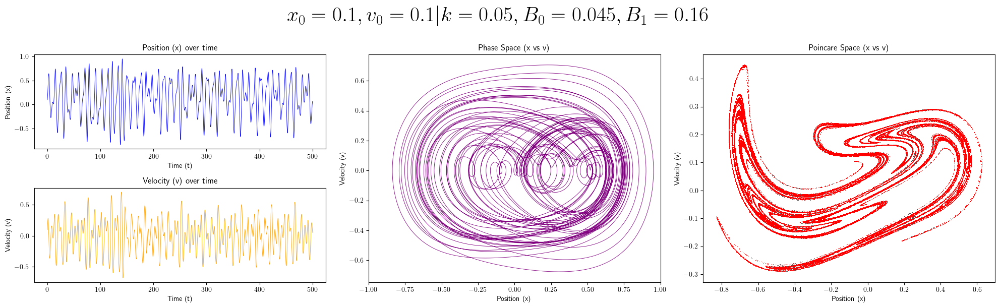

In [11]:
def ueda_duffing(t, y, const):                         
    k, B0, B1 = const             
    dx_dt = y[1]        
    dv_dt = B0 + B1*np.cos(t) - k*y[1] - y[0]**3    
    return np.array([dx_dt, dv_dt])

k = 0.05
B1 = 0.16
x0 = [0.1,0.1]
t_max = 800000
dt = 0.01
period = 2 * np.pi 

for B0 in [0.03, 0.045]:
    t, sol = RK4(ueda_duffing, [0, t_max], (k, B0, B1), dt, x0)
    x, v = sol[:, 0], sol[:, 1]
    ts = np.abs((t % period) - period ) < dt 

    fig = plt.figure(figsize=(20,6))
    gs=fig.add_gridspec(2,3)
    ax1=fig.add_subplot(gs[0,0])
    ax2=fig.add_subplot(gs[1,0])
    ax3=fig.add_subplot(gs[:,1])
    ax4=fig.add_subplot(gs[:,2])
    fig.suptitle(f'$x_0={x[0]}, v_0={v[0]} | k={k}, B_0={B0}, B_1={B1}$', fontsize=30, y=1.01)
        
    ax1.plot(t[:50000], x[:50000], lw=0.6, color='blue')
    ax1.set_title("Position (x) over time")
    ax1.set_xlabel("Time (t)")
    ax1.set_ylabel("Position (x)")
                
    ax2.plot(t[:50000], v[:50000], lw=0.6, color='orange')
    ax2.set_title("Velocity (v) over time")
    ax2.set_xlabel("Time (t)")
    ax2.set_ylabel("Velocity (v)")
        
    ax3.plot(x[:50000], v[:50000], lw=0.6, color='purple')
    ax3.set_title("Phase Space (x vs v)")
    ax3.set_xlabel("Position (x)")
    ax3.set_ylabel("Velocity (v)")
    ax3.set_xlim([-1, 1])
    ax3.set_xlim([-1, 1])
    
    ax4.plot(x[ts], v[ts], 'r,', lw=0.6)
    ax4.set_title("Poincare Space (x vs v)")
    ax4.set_xlabel("Position (x)")
    ax4.set_ylabel("Velocity (v)")
        
    plt.tight_layout()
plt.show()        

$$\textbf{Ueda - Van der Pol attractor }$$ 
Consider the system $\displaystyle{\ddot{x} - \mu\left(1-x^2\right)\dot{x} + x^3 = B \cos \nu t,}$ with $\mu = 0.2, B = 17, \nu=4.$                             
Show numerically that the system has a strange attractor, and plot its Poincaré section. 

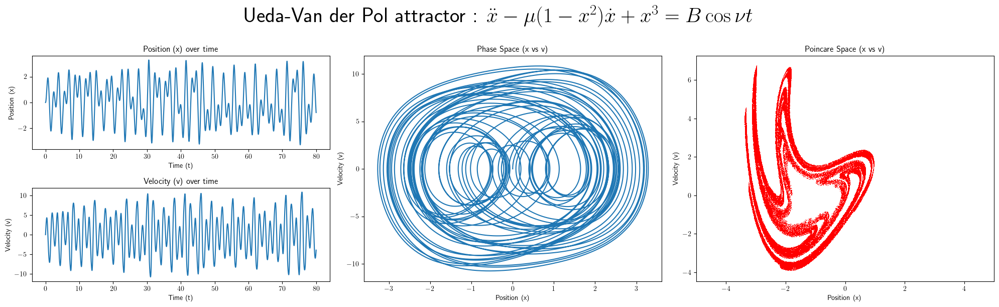

In [14]:
def ueda_vanderpol(t, y, const):                         
    mu, nu, B = const             
    dx_dt = y[1]        
    dv_dt = mu * (1 - y[0]**2) * y[1] - y[0]**3 + B * np.cos(nu * t)    
    return np.array([dx_dt, dv_dt])

mu = 0.2             # Damping coefficient
nu = 4               # Forcing frequency
B = 17               # Forcing amplitude
dt = 0.01            # Time step
t_span = [0, 200000]  # Time span
x0 = [0,0]           # Initial conditions [position, velocity]
period = 2 * np.pi / nu

t, sol = RK4(ueda_vanderpol, t_span, (mu, nu, B), dt, x0)
x, v = sol[:, 0], sol[:, 1]
ts = np.abs((t % period) - period ) < dt 

fig = plt.figure(figsize=(20,6))
plt.suptitle('Ueda-Van der Pol attractor'+r' : $\ddot{x}-\mu(1-x^2)\dot{x}+x^3=B\cos\nu t $',y=1.01, fontsize=30)
gs = fig.add_gridspec(2, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])
ax4 = fig.add_subplot(gs[:, 2])

ax1.plot(t[:8000], x[:8000])
ax1.set_title("Position (x) over time")
ax1.set_xlabel("Time (t)")
ax1.set_ylabel("Position (x)")

ax2.plot(t[:8000], v[:8000])
ax2.set_title("Velocity (v) over time")
ax2.set_xlabel("Time (t)")
ax2.set_ylabel("Velocity (v)")

ax3.plot(x[:8000], v[:8000])
ax3.set_title("Phase Space (x vs v)")
ax3.set_xlabel("Position (x)")
ax3.set_ylabel("Velocity (v)")

ax4.plot(x[ts], v[ts],'r,',ms=0.4)
ax4.set_title("Poincare Space (x vs v)")
ax4.set_xlabel("Position (x)")
ax4.set_ylabel("Velocity (v)")
ax4.set_xlim([-10, 10])
ax4.set_xlim([-5, 5])

plt.tight_layout()
plt.show()

## $$\textit{Lorenz Attractor}$$
In 1961 $\bf{\text{Edward Lorenz}}$ used a simplified version of the hydrodynamic equations including convection, viscosity, and gravity to predict weather patterns.                                                   
The computations were so sensitive to parameter values that at first he thought he had a numerical problem,                
though eventually realized that the system was chaotic .                         
$\bf{\text{Lorenz’s equations}}$ with simplified variables are                                                                                                          
$ \qquad \mathbf{ \dot{x}= \delta(y-x) } $                                                                                               
$ \qquad \mathbf{ \dot{y}= x(\rho-z)-y }$                                                                                              
$ \qquad \mathbf{ \dot{z}=xy-{\beta z} }$                                                                                                                   
where $x(t)$ is a measure of fluid velocity as a function of time $t, y(t)$ and $z(t)$ are                                  
measures of the $y$ and $z$ temperature distributions, and $\sigma,\rho,$ and $\beta$ are parameters.                        
The $xz$ and $xy$ terms make these equations non-linear.                                                                    
1. Modify your ODE solver to handle these three, simultaneous Lorenz equations.                                              
2. To start, use parameter values $\mathbf{\sigma = 10, \rho = \frac{8}{3},}$ and $\mathbf{\beta = 28}$.                                              
3. Make sure to use a small enough step size so that good precision is obtained.                                                  
You must have confidence that you are seeing chaos and not numerical error.                                                       
4. Makes plots of $x$ versus $t, y$ versus $t,$ and $z$ versus $t.$                                                          
5. The initial behaviors in these plots are called “transients” and are not considered dynamically interesting.        
Leave off these transients in the plots to follow.                                                                           
6. Make a **phase space** plot of $z(t)$ versus $x(t)$.                                                                    
The distorted, number eightlike figures you obtain  are called Lorenz attractors, “attractors” because even chaotic solutions tend to be attracted to them.                                                                                             
7. Make **phase space** plots of $y(t)$ versus $x(t)$ and $z(t)$ versus $y(t)$.                                                         
8. Make a 3-D plot of $x(t)$ versus $y(t)$ versus $z(t)$.                                                                       
9. The parameters given to you should lead to chaotic solutions.                                                       
Check this claim by finding the smallest change you can make in a parameter that still produce different answers.           
10. Using numerical integration, compute the $\bf{\text{Lorenz map}}$.                                                                      
11. Make a $\bf{\text{Poincaré mapping}}$  of the transverse section where $z=r-1$                                                                                                                              
(A $\bf{\text{Poincaré mapping}}$ is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)                                                   
12. Estimate the $\it{\text{largest }}\bf{\text{Liapunov exponent}}$ of two nearby trajectories for the Lorenz system.                


In [12]:
def Lorenzfunction(t,y,const):      
    sigma, beta, rho = const            # constant in Lorentz eqns
    dx_dt = -sigma*(y[0] - y[1])        # dx/dt = -sigma*(x-y)
    dy_dt = y[0]*(rho - y[2]) - y[1]    # dy/dt = x*(r-z)-y
    dz_dt = -beta*y[2] + y[0]*y[1]      # dz/dt = -b*z+x*y
    return np.array([dx_dt, dy_dt, dz_dt])

### **$\textit{Lorenz Map}$**
The “single feature” that Lorenz focuses on is $z_n$, the $n^{th}$ local maximum of $z(t)$. His idea is that $z_n$ should predict $z_{n+1}$.                                                                                                                  
The function $z_{n+1}=f(z_n)$ shown in Figure is now called the $\it{\text{Lorenz Map}}$.                                     
The key observation is that the graph in Figure right satisfies $|f'(z)|>1$ everywhere.                                           
This property ultimately implies that if any limit cycles exist, they are necessarily unstable.                                                               
Given a list of numbers $ \{z_1, z_2, \ldots, z_n\}$, the algorithm aims to identify local maxima,                          
which are elements in the list that are greater than both their preceding and succeeding elements (if they exist).                              
Here's a mathematical interpretation of each step:                                                                             
1.  Let $ n $ be the length of the list of numbers, i.e., $ n = | \{z_1, z_2, \ldots, z_n\} | $.   
2.  If $ n \geq 2 $, check the first element $z_1$:                             
    If $z_1 > z_2 $, add $ z_1 $ to $ M $. This implies that $z_1$ is a local maximum.                     
3.  If $n > 3$, loop through the elements from index 2 to $n-1$ (inclusive):                     
  For each element $ z_i $ at index $i$, check if it is greater than its preceding $ z_{i-1} $ and succeeding $ z_{i+1} $ elements:                                                                                                                         
       If $ z_i > z_{i-1}$ and $ z_i > z_{i+1} $, add $ z_i $ to $M$.                                                      
4.  Check the last element $ z_n $:                                                                                                                     
      If $z_n > z_{n-1}$, add $z_n$ to $M$. This implies that $z_n$ is a local maximum.                                           
                                                                                                                                      
                                      
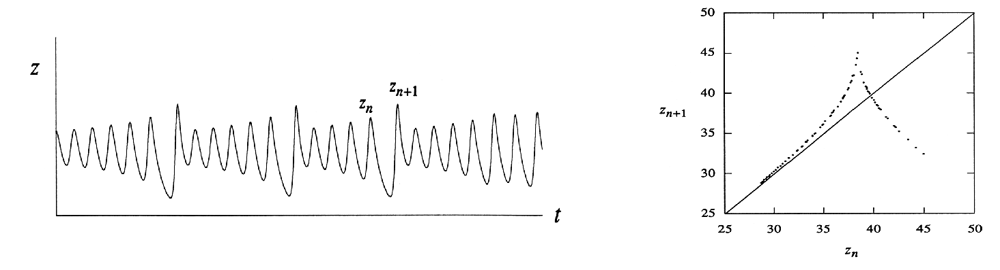


The $\textit{Lorenz Map}$ is different from $\textit{Poincaré map}$ because it characterizes the trajectory by only one number, not two.                                                                                                                           
This simpler approach works only if the attractor is very “flat”, i.e., close to 2D, as the Lorenz attractor is.

In [13]:
def FindMaxima(z,t):
    Mz = []
    Tz = []
    n = len(z)
    if n >= 2:
        if z[0] > z[1]:
            Mz.append(z[0])
            Tz.append(t[0])

    if n > 3:
        for i in range(1, n-1):     
            if z[i] > z[i-1] and z[i] > z[i+1]:
                Mz.append(z[i])
                Tz.append(t[i])
    
    if z[n-1] > z[n-2]:    
        Mz.append(z[n-1])  
        Tz.append(t[n-1])
    return Mz, Tz

### $\textit{Poincaré Map }$

To construct a $\textit{Poincaré map}$ for a 3D flow, we compute a trajectory’s successive intersections with a 2D surface.                                                                                                           
The $\textit{Poincaré map}$ takes a point on that surface, specified by two coordinates,                                              
and then tells us how those two coordinates change after the first return to the surface.                                           
Detect intersections with the plane $z = r - 1$ is a good choice, which is the level of the two fixed points .                    
 Then, at each time step, you will need to perform a test with the updated $z-$coordinate $(z_{new}, say)$ and the previous $z-$coordinate $(z_{old})$.                                                                                                      
 More precisely, you will need to add an $(x, y)$ point to your $\textit{Poincaré section}$ if $z − (r − 1)$ changes sign.        
We might need to take care to get a neat $\textit{Poincaré section } :$                                                                      
   1. We will need to run your code for a long time to get enough points – perhaps a thousand.                                 
  2. We may wish to consider whether or not you wish to use all the points obtained, or simply those over a certain portion of the evolution.                                                                                                    
  3. We may need to interpolate between $x_{new}$ and $x_{old}$ to find more precisely the values of $x$ and $y$ for your plot. 

In [14]:
def poincare_section(x,y,z, t, r):
    
    def poincare_c(z, r):
        
        return z - (r - 1)
    
    poincare_x = []
    poincare_y = []
    
    for i in range(1, len(t)):
        
        if poincare_c(z[i], r) * poincare_c(z[i-1], r) < 0:
            # Interpolate to find more precise (x, y) values
            alpha = abs(poincare_c(z[i], r) / (poincare_c(z[i], r) - poincare_c(z[i-1], r)))
            x_p = x[i-1] + alpha * (x[i] - x[i-1])
            y_p = y[i-1] + alpha * (y[i] - y[i-1])
            poincare_x.append(x_p)
            poincare_y.append(y_p)
            
    return np.array([poincare_x, poincare_y])

### $\textit{Liapunov exponent from Exponential Divergence of Nearby Trajectories}$                                                         
Suppose that we let transients decay, so that a trajectory is “on” the attractor.                                            
Suppose $x(t)$ is a point on the attractor at time $t$, and consider a nearby point, say $x(t)+\delta(t)$,                     
where $\delta$ is a tiny separation vector of initial length $||\delta_0 || = 10^{–15}$, say                                     
In numerical studies of the Lorenz attractor, one finds that                                                                         
$\qquad || \delta ( t ) || \sim || \delta_0 || \exp(\lambda t)$
where $\lambda = 0.9$.                                                                                                       
Hence neighboring trajectories separate exponentially fast.                                                                                 
Equivalently, if we plot $\ln ||\delta ( t ) ||$ versus $t$, we find a curve that is close to a straight line with a positive slope of $\lambda$                                                                                                      
We need to add some qualifications:
1. The curve is never exactly straight.                                                                                       
It has wiggles because the strength of the exponential divergence varies somewhat along the attractor.                              
2. The exponential divergence must stop when the separation is comparable to the “diameter” of the attractor                   
the trajectories obviously can’t get any farther apart than that. This explains the leveling off or saturation of the curve      
3. The number $\lambda$ is often called the Liapunov exponent, although this is a sloppy use of the term, for two reasons:                      
   i. First, there are actually n different Liapunov exponents for an n-dimensional system, defined as follows.              
   Consider the evolution of an infinitesimal sphere of perturbed initial conditions.                                         
   During its evolution, the sphere will become distorted into an infinitesimal ellipsoid.                                         
   Let $\delta_k(t), k=1,... , n,$ denote the length of the kth principal axis of the ellipsoid.                              
   Then $\delta_k(t)\sim\delta_k(t)\exp(\lambda t),$ where the $\lambda_k$ are the Liapunov exponents.                        
   For large $t$, the diameter of the ellipsoid is controlled by the most positive $\lambda_k$.                             
   Thus our $\lambda$ is actually the largest Liapunov exponent.                                                                
   ii. Second, $\lambda$ depends (slightly) on which trajectory we study.     
   We should average over many different points on the same trajectory to get the true value of $\lambda$.                           
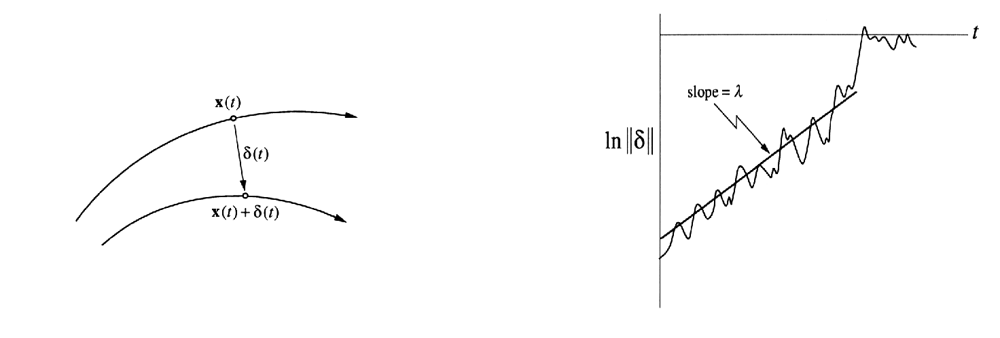      



Algorithm :                                                                                                                       
     i. Declare initial contition                                                                                                   
     ii. Setting a perturbeted initial condition with $ z\rightarrow z+1$                                                           
     iii. Setting $\displaystyle \text{displacement}=\sqrt{(x-x_p)^2+(y-y_p)^2+(z-z_p)^2}$                                                                  
     iv. Setting $\displaystyle \text{displacement} \rightarrow \log(\text{displacement})$                                                               
      v. Set the time period length for regression then find $m$ from the fit.  


### $\textit{Linear Regression}$
We use the Slope intercept form for the straight line :**$\quad \displaystyle{ y = mx + c }$**                                         
where                                                                                                                      
- $m$ is the slope                                                                                                         
- $c$ is the y-intercept

Best fit of Linear regressions:                                                                                                                  
$\qquad \displaystyle{m = \frac{N\sum x_i y_i - \sum x_i \sum y_i}{N\sum x_i^2 - \big(\sum x_i \big)^2} \qquad c = \frac{\sum y_i \sum x_i^2 - \sum x_i \sum x_i y_i}{N\sum x_i^2 - \big(\sum x_i\big)^2} }$



In [15]:
def fit(x,y):
    n = len(x)
    sx = sum(x)
    sy = sum(y)
    sx2 = sum(x*x)
    sxy = sum(x*y)
    b = (n*sx2 - sx**2)
    m = (n*sxy - sx*sy) / b
    c = (sy*sx2 - sx*sxy) / b
    return m,c

### Discrete Fourier Transform (DFT)


$\qquad\displaystyle X_k=\sum_{n=0}^{N−1}x_n\cdot \exp\bigg(−\frac{2\pi ikn}{N}\bigg)$

### Fast Fourier Transform (FFT)

$\qquad\displaystyle\begin{align} 
X_k & =\sum_{n=0}^{N−1}x_n\cdot \exp\bigg(−\frac{2\pi ikn}{N} \bigg) \\
    & = \sum_{m=0}^{N/2−1}x_{2m}\cdot\exp\bigg(−2\pi ik(2m)/N\bigg)+\sum_{m=0}^{N/2−1}x_{2m+1}\cdot\exp\bigg(−2\pi ik(2m+1)/N\bigg) \\
    & = \sum_{m=0}^{N/2−1}x_{2m}\cdot\exp\bigg(−2\pi ikm/(N/2)\bigg)+\exp\bigg(−2\pi ik/N\bigg) \sum_{m=0}^{N/2−1}x_{2m+1}\cdot\exp\bigg(−2\pi ikm/(N/2)\bigg)  \end{align}$

In [16]:
def dft(x):
    N = len(x)
    n = np.arange(N)
    k = n.reshape((N, 1))
    e = np.exp(-2j*np.pi*k*n/N)
    X = np.dot(e, x)
    return X

def freq(X, dt):
    N_2 = len(X)
    n_2 = np.arange(N_2)
    frq = (n_2/N_2)*dt
    return frq

### $\textit{Bifurcation}$

#### Bifurcation Detection

1. **State Variable Time Series**:
   - For each $(r)$ value, the Lorenz system is integrated over the time span to obtain time series for $x,y,$ and $z$.

2. **Finding Local Extrema**:
   - For a given time series $ (s = \{s_i\})$ (representing $x,y,$ or $z,$)                                                                                           
     Local maxima and minima are identified by checking the conditions:                                                                
     $\text{Maxima }(C^+) \ : \quad s[i-1] < s[i] \text{ and } s[i] > s[i+1]$                                                              
     $\text{Minima }(C^-) \ : \quad \ s[i-1] > s[i] \text{ and } s[i] < s[i+1]$

3. **Collecting Results**:
   - The values of $r$ corresponding to the detected $(C^+) \& (C^-)$ are stored along with the state variable values.


In [17]:
def bifurcation(s, rho):
    r_maxes, r_mins = [], []
    s_maxes, s_mins = [], []

    for i in range(1, len(s) - 1):
        if s[i - 1] < s[i] and s[i] > s[i + 1]:
            r_maxes.append(rho)
            s_maxes.append(s[i])
        elif s[i - 1] > s[i] and s[i] < s[i + 1]:
            r_mins.append(rho)
            s_mins.append(s[i])
    return r_maxes, s_maxes, r_mins, s_mins

In [20]:
dt = 0.001
t_span = [0, 80]

# constants
sigma = 10
r = 28
b = 8/3
const = sigma, b, r

# initials
init_main = [0.8961, 1.5605, 11.246]
t, M = RK4( Lorenzfunction, t_span, const, dt, init_main)
xx, yy, zz = M[:, 0], M[:, 1], M[:, 2]

# Perturb z by 0.001
init_perturbed = [0.8961, 1.5605, 11.247]  
t_p, M_p = RK4( Lorenzfunction, t_span, const, dt, init_perturbed)
xx_p, yy_p, zz_p = M_p[:, 0], M_p[:, 1], M_p[:, 2]

# Liapunov exponent from Exponential Divergence
D = np.real(np.sqrt((xx - xx_p)**2 + (yy - yy_p)**2 + (zz - zz_p)**2)) # Divergence of Nearby Trajectories
m,c = fit(t[int(1/dt):int(9.556/dt)], np.log(D[int(1/dt):int(9.556/dt)]))
Y = np.exp(m * t[int(1/dt):int(9.556/dt)] + c)
err = ((0.9-m)/0.9)*100

# Lorenz Map (Maxima z_n)
z_n,t_n = FindMaxima(zz, t) 

# Poincaré Map 
poincare_x, poincare_y  = poincare_section(xx_p, yy_p, zz_p, t, r)

# FFT
ddt = 0.1
t_F, M_F = RK4( Lorenzfunction, t_span, const, ddt, init_main)
xx_F, yy_F, zz_F = M_F[:, 0], M_F[:, 1], M_F[:, 2]
X_F, Y_F, Z_F = dft(xx_F), dft(yy_F), dft(zz_F)
Nx, Ny, Nz = len(X_F), len(Y_F), len(Z_F)
xf, yf, zf = freq(X_F, ddt), freq(Y_F, ddt), freq(Z_F, ddt)

# Bifurcation
dr = 0.1
r_values = np.arange(0, 400, dr)
dt1 = 0.01
t_span = [0, 10]

xr_maxes, xs_maxes, xr_mins, xs_mins = [], [], [], []
yr_maxes, ys_maxes, yr_mins, ys_mins = [], [], [], []
zr_maxes, zs_maxes, zr_mins, zs_mins = [], [], [], []

for x0 in ([0.1,0.1,0.1], [-0.1,-0.1,-0.1]):
    for rho in r_values:
        const = sigma, b, rho
        t1, M = RK4(Lorenzfunction, t_span, const, dt, x0)
        xs, ys, zs = M[:, 0], M[:, 1], M[:, 2]
    
        xr_max, xs_max, xr_min, xs_min = bifurcation(xs, rho)
        yr_max, ys_max, yr_min, ys_min = bifurcation(ys, rho)
        zr_max, zs_max, zr_min, zs_min = bifurcation(zs, rho)

        xr_maxes.extend(xr_max)
        xs_maxes.extend(xs_max)
        xr_mins.extend(xr_min)
        xs_mins.extend(xs_min)

        yr_maxes.extend(yr_max)
        ys_maxes.extend(ys_max)
        yr_mins.extend(yr_min)
        ys_mins.extend(ys_min)

        zr_maxes.extend(zr_max)
        zs_maxes.extend(zs_max)
        zr_mins.extend(zr_min)
        zs_mins.extend(zs_min)

        x0 = [xs[-1], ys[-1], zs[-1]]

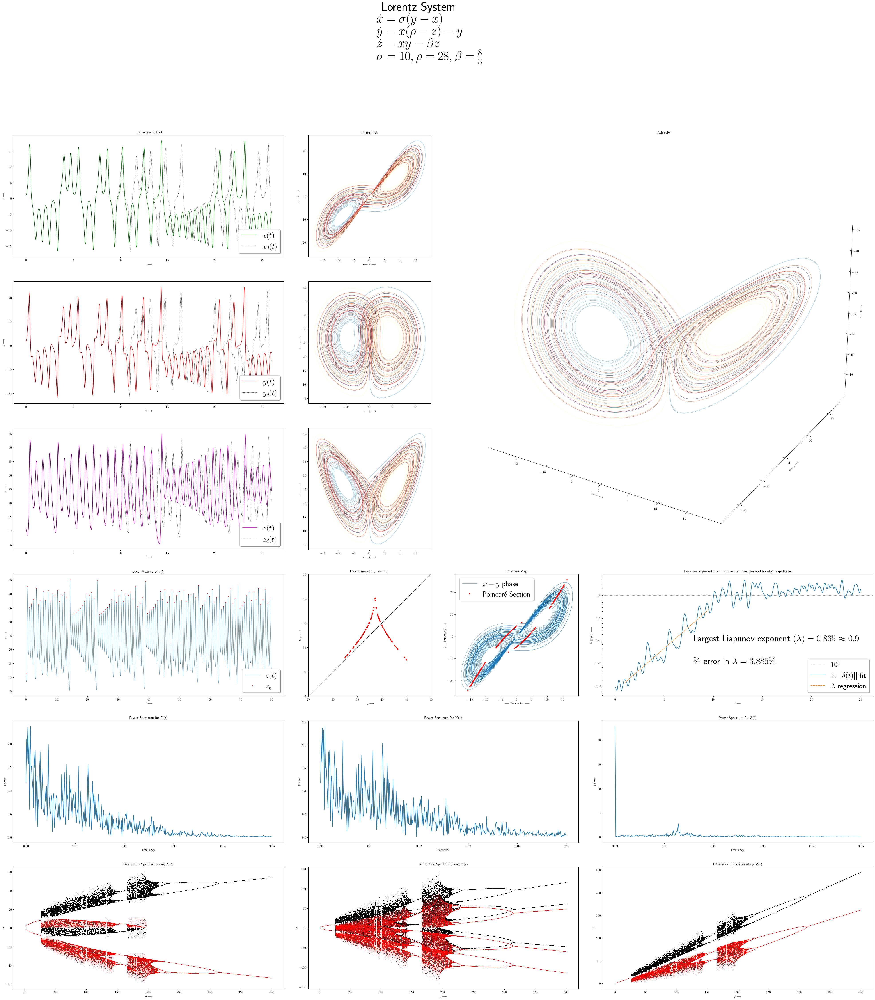

In [21]:
fig = plt.figure(figsize=(50,50))
plt.suptitle('Lorentz System'
             + r'$ \\ \dot{x}= \sigma(y-x)  \\ \dot{y}= x(\rho-z)-y \\ \dot{z}=xy-{\beta z} \\ $'
             + r'$ \sigma = 10, \rho = 28, \beta = \frac{8}{3} $',  fontsize=40,y=1.)

gs=fig.add_gridspec(6,6)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[1,0:2])
ax3=fig.add_subplot(gs[2,0:2])
ax4=fig.add_subplot(gs[0,2])
ax5=fig.add_subplot(gs[1,2])
ax6=fig.add_subplot(gs[2,2])
ax7=fig.add_subplot(gs[0:3,3:6], projection='3d')
ax8=fig.add_subplot(gs[3,0:2])
ax9=fig.add_subplot(gs[3,2])
ax10=fig.add_subplot(gs[3,3])
ax11=fig.add_subplot(gs[3,4:6])
ax12=fig.add_subplot(gs[4,0:2])
ax13=fig.add_subplot(gs[4,2:4])
ax14=fig.add_subplot(gs[4,4:6])
ax15=fig.add_subplot(gs[5,0:2])
ax16=fig.add_subplot(gs[5,2:4])
ax17=fig.add_subplot(gs[5,4:6])

ax1.set_xlabel(r'$t \longrightarrow$')
ax1.set_ylabel(r'$x \longrightarrow$')
ax2.set_xlabel(r'$t \longrightarrow$')
ax2.set_ylabel(r'$y \longrightarrow$')
ax3.set_xlabel(r'$t \longrightarrow$')
ax3.set_ylabel(r'$z \longrightarrow $')
ax4.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax4.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax5.set_xlabel(r'$\longleftarrow y \longrightarrow$')
ax5.set_ylabel(r'$\longleftarrow z \longrightarrow$')
ax6.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax6.set_ylabel(r'$\longleftarrow z \longrightarrow$')
ax7.xaxis.set_pane_color((1,1,1,1))
ax7.yaxis.set_pane_color((1,1,1,1))
ax7.zaxis.set_pane_color((1,1,1,1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.grid(False)
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')
ax8.set_xlabel(r'$t \longrightarrow$')
ax8.set_ylabel(r'$ z \longrightarrow$')
ax9.set_xlabel(r'$z_n \longrightarrow$')
ax9.set_ylabel(r'$z_{n+1} \longrightarrow$')
ax10.set_xlabel(r'$\longleftarrow$ Poincaré x $\longrightarrow$')
ax10.set_ylabel(r'$\longleftarrow$ Poincaré y $\longrightarrow$')
ax11.set_xlabel(r'$t \longrightarrow$')
ax11.set_ylabel(r'$ \ln ||\delta(t)|| \longrightarrow$')
ax12.set_xlabel('Frequency')
ax12.set_ylabel('Power')
ax13.set_xlabel('Frequency')
ax13.set_ylabel('Power')
ax14.set_xlabel('Frequency')
ax14.set_ylabel('Power')
ax15.set_xlabel(r'$\rho \longrightarrow$')
ax15.set_ylabel(r'$x$')
ax16.set_xlabel(r'$\rho \longrightarrow$')
ax16.set_ylabel(r'$y$')
ax17.set_xlabel(r'$\rho \longrightarrow$')
ax17.set_ylabel(r'$z$')

# 1D Displacement plot
ax1.plot(t[:int(26/dt)],xx[:int(26/dt)],  'g',   linewidth=1.1, label=r'$x(t)$')
ax1.plot(t[:int(26/dt)],xx_p[:int(26/dt)],'k--', linewidth=0.5, label=r"$ x_d(t)$")
ax2.plot(t[:int(26/dt)],yy[:int(26/dt)],  'r',   linewidth=1.1, label=r'$y(t)$')
ax2.plot(t[:int(26/dt)],yy_p[:int(26/dt)],'k--', linewidth=0.5, label=r"$ y_d(t) $")
ax3.plot(t[:int(26/dt)],zz[:int(26/dt)],  'm',   linewidth=1.1, label=r'$z(t)$')
ax3.plot(t[:int(26/dt)],zz_p[:int(26/dt)],'k--', linewidth=0.5, label=r"$ z_d(t)$")
    
s = 10
n = len(t)
for i in range(0,n-s,s):
    ax4.plot(xx[i:i+s+1], yy[i:i+s+1], color=plt.cm.RdYlBu_r((i+1)/n), linewidth=0.5)             # XY Phase Plot 2D
    ax5.plot(yy[i:i+s+1], zz[i:i+s+1], color=plt.cm.RdYlBu_r((i+1)/n), linewidth=0.5)             # YZ Phase Plot 2D
    ax6.plot(xx[i:i+s+1], zz[i:i+s+1], color=plt.cm.RdYlBu_r((i+1)/n), linewidth=0.5)             # XZ Phase Plot 2D
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1],color=plt.cm.RdYlBu_r((i+1)/n), linewidth=0.5) # 3D Attractor
    
ax8.plot(t, zz, linewidth=0.5, label=r'$z(t)$')
ax8.plot(t_n, z_n, 'r.', ms=2.5, label=r'$z_n$')                  # Local Maxima of z_n

#ax9.plot(z_n[0:-1], z_n[0:-1], 'k--')
ax9.axline([0, 0], [1, 1], color = 'black', linestyle = '--', linewidth = 1.1)  # PI/4 angle
ax9.plot(z_n[1:-2], z_n[2:-1], 'r.')                                            # Lorenz Map
ax9.set_xlim([25,50])
ax9.set_ylim([25,50])

ax10.plot(xx, yy, linewidth=0.4, label=r'$x-y$ phase')            # x-y phase of Lorenz Attractor
ax10.plot(poincare_x, poincare_y, 'r.', label='Poincaré Section') # Poincaré Section Plot

ax11.axhline(y=10**1, color="grey", linestyle=":", label=r'$10^1$')
ax11.semilogy(t[:int(25/dt)],D[:int(25/dt)], label=r"$\ln || \delta(t)||$  fit")  # Exponential Divergence
ax11.plot(t[int(1/dt):int(9.556/dt)], Y, '--', label="$\lambda$  regression")     # Liapunov plot 
ax11.text(8,10**(-1), r'Largest Liapunov exponent $ ( \lambda ) = {:.4} \approx 0.9$'.format(m), fontsize=30)
ax11.text(8,10**(-2), r' $ \% $ error in $ \lambda = {:.4}\% $'.format(err), fontsize=30)

# FFT
ax12.plot(xf[:Nx//2], 2.0/Nx * np.abs(X_F[:Nx//2]))
ax13.plot(yf[:Ny//2], 2.0/Ny * np.abs(Y_F[:Ny//2]))
ax14.plot(zf[:Nz//2], 2.0/Nz * np.abs(Z_F[:Nz//2]))

# Bifurcation
ax15.plot(xr_maxes, xs_maxes, 'k,')
ax15.plot(xr_mins,  xs_mins,  'r,')
ax16.plot(yr_maxes, ys_maxes, 'k,')
ax16.plot(yr_mins,  ys_mins,  'r,')
ax17.plot(zr_maxes, zs_maxes, 'k,')
ax17.plot(zr_mins,  zs_mins,  'r,')

ax1.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax2.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax3.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax8.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax10.legend(fontsize=24,loc='upper left' ,  fancybox=True, shadow=True, ncol=1)
ax11.legend(fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)

ax1.set_title('Displacement Plot')
ax4.set_title('Phase Plot')
ax7.set_title('Attractor')
ax8.set_title(r'Local Maxima of $z(t)$')
ax9.set_title(r'Lorenz map $(z_{n+1} \ vs. \ z_n)$')
ax10.set_title('Poincaré Map')
ax11.set_title('Liapunov exponent from Exponential Divergence of Nearby Trajectories')
ax12.set_title(r'Power Spectrum for $X(t)$')
ax13.set_title(r'Power Spectrum for $Y(t)$')
ax14.set_title(r'Power Spectrum for $Z(t)$')
ax15.set_title(r'Bifurcation Spectrum along $X(t)$')
ax16.set_title(r'Bifurcation Spectrum along $Y(t)$')
ax17.set_title(r'Bifurcation Spectrum along $Z(t)$')

plt.show()

The graph was made by running an arbitrary initial condition until the trajectory was on the Lorenz attractor at $(x; y; z) = (0.8961; 1.5605; 11.246)$.                                                                                              
Then the trajectory and a perturbed trajectory of $(x; y; z) = (0.8961; 1.5605; 11.246+0.001)$ were simulated until $t = 25$       
and the error computed in the following graph.                                                                              
Then we used a linear fit of the error between $t\in[1; 10]$ so as to avoid the initial transient and leveling off of the error.                                                                                                                       
The slope is an estimate of the largest Liapunov exponent, $\lambda = 0.865 \approx 0.9$.                                    
The latter is the "real" value calculated with more advanced methods.

Investigate the simplified version of the $\bf{\text{Lorenz attractors}}$ developed by $\bf{\text{R}}\ddot{o}\bf{\text{essler}}$ [Becker(86)]:                                               
$ \quad \dot{x} = −y − z $                                                                                                      
$\quad \dot{y} = x + ay $                                                                                                        
$\quad \dot{z} = b + xz − cz $                                                                                                        
$\quad (a, b, c) = (0.2, 0.2, 5.7). $                                                                                                            
a. Compute and plot $x(t), y(t),$ and $z(t)$ as functions of time.                                                                 
b. Plot projections of your solutions onto the $(x, y)$ and $(x, \dot{x})$ planes.                                                       
c. Make a Poincaré mapping of the transverse section $\dot{x} = 0$.                                                                      
$\quad $(A Poincaré mapping is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)               
d. When $\dot{x} = 0, x$ has an extremum. Plot the value of the extrema $x_{i+1}$ as a function of the previous extremum $x_i$.

3. Make sure to use a small enough step size so that good precision is obtained.                                                  
You must have confidence that you are seeing chaos and not numerical error.                                                       
4. Makes plots of $x$ versus $t, y$ versus $t,$ and $z$ versus $t.$                                                          
5. The initial behaviors in these plots are called “transients” and are not considered dynamically interesting.        
Leave off these transients in the plots to follow.                                                                           
6. Make a **phase space** plot of $z(t)$ versus $x(t)$.                                                                    
The distorted, number eightlike figures you obtain  are called Lorenz attractors,                                             
“attractors” because even chaotic solutions tend to be attracted to them.                                                                                             
7. Make **phase space** plots of $y(t)$ versus $x(t)$ and $z(t)$ versus $y(t)$.                                                         
8. Make a 3-D plot of $x(t)$ versus $y(t)$ versus $z(t)$.                                                                       
9. The parameters given to you should lead to chaotic solutions.                                                       
Check this claim by finding the smallest change you can make in a parameter that still produce different answers.              
10. Estimate the $\it{\text{largest }}\bf{\text{Liapunov exponent}}$ of two nearby trajectories for the Lorenz system.                
11. Using numerical integration, compute the $\bf{\text{Lorenz map}}$.                                                                      
12. Make a $\bf{\text{Poincaré mapping}}$  of the transverse section where $z=r-1$                                                                                                                              
(A $\bf{\text{Poincaré mapping}}$ is the intersection of a periodic orbit in the phase space with a lower-dimensional subspace.)                                                   
13. Show the $\bf{\text{Bifurcation map}}$ for $C^+ \ \& \ C^- $ with respect to $\rho$ .                                             

In [9]:
def Rf(t,y,const):     
    const = a,b,c
    dx_dt = -y[1]-y[2]            # xdot =  -y-z
    dy_dt = y[0] + a*y[1]         # ydot = x+ay
    dz_dt = b + y[0]*y[2]-c*y[2]  # zdot = b+xz-cz
    return np.array([dx_dt, dy_dt, dz_dt])

In [10]:
dt = 0.01 
t_span = [0,800]
y = [10, -2, 0.2]
a = 0.2       
b = 0.2      
c = 5.7
const = a,b,c    

tRK4, MRK4 = RK4(Rf, t_span, const, dt, y)
xx,yy,zz = MRK4[:,0],MRK4[:,1],MRK4[:,2]

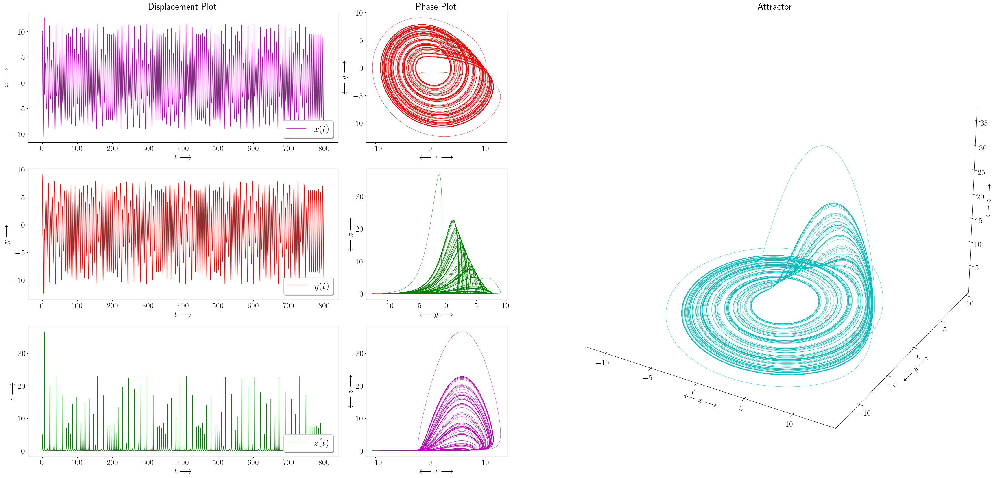

In [11]:
fig = plt.figure(figsize=(44,20))

gs=fig.add_gridspec(3,6)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[1,0:2])
ax3=fig.add_subplot(gs[2,0:2])
ax4=fig.add_subplot(gs[0,2])
ax5=fig.add_subplot(gs[1,2])
ax6=fig.add_subplot(gs[2,2])
ax7=fig.add_subplot(gs[0:3,3:6], projection='3d')

ax1.set_xlabel(r'$t \longrightarrow$')
ax1.set_ylabel(r'$x \longrightarrow$')
ax2.set_xlabel(r'$t \longrightarrow$')
ax2.set_ylabel(r'$y \longrightarrow$')
ax3.set_xlabel(r'$t \longrightarrow$')
ax3.set_ylabel(r'$z \longrightarrow $')
ax4.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax4.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax5.set_xlabel(r'$\longleftarrow y \longrightarrow$')
ax5.set_ylabel(r'$\longleftarrow z \longrightarrow$')
ax6.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax6.set_ylabel(r'$\longleftarrow z \longrightarrow$')
ax7.xaxis.set_pane_color((1,1,1,1))
ax7.yaxis.set_pane_color((1,1,1,1))
ax7.zaxis.set_pane_color((1,1,1,1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.grid(False)
ax7.set_xlabel(r'$\longleftarrow x \longrightarrow$')
ax7.set_ylabel(r'$\longleftarrow y \longrightarrow$')
ax7.set_zlabel(r'$\longleftarrow z \longrightarrow$')

# 1D Displacement plot
ax1.plot(tRK4, xx, 'm', linewidth=1.1, label=r'$x(t)$')
ax2.plot(tRK4, yy, 'r', linewidth=1.1, label=r'$y(t)$')
ax3.plot(tRK4, zz, 'g', linewidth=1.1, label=r'$z(t)$')

ax4.plot(xx, yy, color='r', linewidth=0.5)             # XY Phase Plot 2D
ax5.plot(yy, zz, color='g', linewidth=0.5)             # YZ Phase Plot 2D
ax6.plot(xx, zz, color='m', linewidth=0.5)             # XZ Phase Plot 2D
ax7.plot(xx, yy, zz, color='c', linewidth=0.5)         # 3D Attractor

ax1.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax2.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)
ax3.legend( fontsize=24,loc='lower right',  fancybox=True, shadow=True, ncol=1)

ax1.set_title('Displacement Plot')
ax4.set_title('Phase Plot')
ax7.set_title('Attractor')
plt.show()    

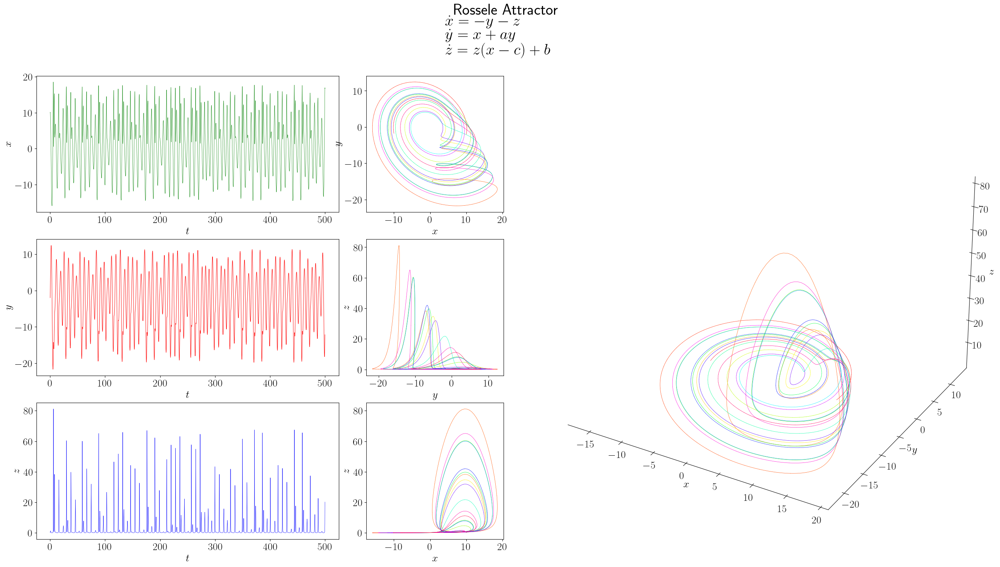

In [43]:
dt = 0.01 
j = 1
t_span = [0,500]

y = [10, -2, 0.2]

a = 0.343        
b = 1.82      
c = 9.75
const = a,b,c    

t, M = RK4(Rf, t_span, const, dt, y)
xx,yy,zz = M[:,0],M[:,1],M[:,2]

    
fig = plt.figure(figsize=(33,16))
fig.suptitle('Rossele Attractor'+ 
             r'$ \\ \dot{x}= -y-z  \\ \dot{y}= x+ay \\ \dot{z}= z(x- c)+b $',
             fontsize=30,y=1.)
gs=fig.add_gridspec(3,6)
ax1=fig.add_subplot(gs[0,0:2])
ax2=fig.add_subplot(gs[1,0:2])
ax3=fig.add_subplot(gs[2,0:2])
ax4=fig.add_subplot(gs[0,2])
ax5=fig.add_subplot(gs[1,2])
ax6=fig.add_subplot(gs[2,2])
ax7=fig.add_subplot(gs[0:3,3:6],projection='3d')


ax1.set_xlabel(r'$t$')
ax1.set_ylabel(r'$x$')
ax2.set_xlabel(r'$t$')
ax2.set_ylabel(r'$y$')
ax3.set_xlabel(r'$t$')
ax3.set_ylabel(r'$z$')
ax4.set_xlabel(r'$x$')
ax4.set_ylabel(r'$y$')
ax5.set_xlabel(r'$y$')
ax5.set_ylabel(r'$z$')
ax6.set_xlabel(r'$x$')
ax6.set_ylabel(r'$z$')
ax7.xaxis.set_pane_color((1,1,1,1))
ax7.yaxis.set_pane_color((1,1,1,1))
ax7.zaxis.set_pane_color((1,1,1,1))
ax7.xaxis.pane.set_edgecolor('w')
ax7.yaxis.pane.set_edgecolor('w')
ax7.zaxis.pane.set_edgecolor('w')
ax7.grid(False)
ax7.set_xlabel(r'$x$')
ax7.set_ylabel(r'$y$')
ax7.set_zlabel(r'$z$')

s = 10
n = 10000
ax1.plot(t,xx,'g', linewidth=0.5)
ax2.plot(t,yy,'r', linewidth=0.7)
ax3.plot(t,zz,'b', linewidth=0.5)
for i in range(0,n-s,s):
    ax4.plot(xx[i:i+s+1],yy[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax5.plot(yy[i:i+s+1],zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax6.plot(xx[i:i+s+1],zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5)
    ax7.plot(xx[i:i+s+1], yy[i:i+s+1], zz[i:i+s+1],color=plt.cm.hsv((i+1)/n), linewidth=0.5) 
    #ax7.view_init(10,-50)

plt.show()

### Bifurcation 

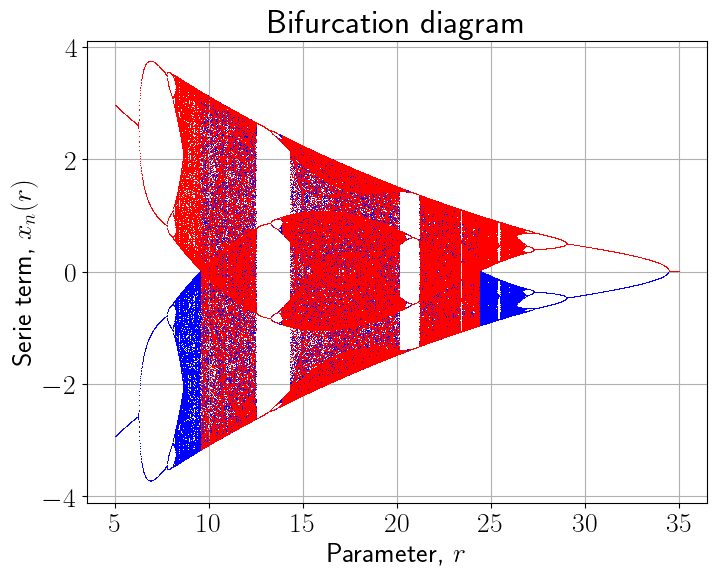

In [3]:
def model(x, r):
    return 5.821 * np.tanh(1.487 * x) - r * np.tanh(0.2223 * x)

def diagram(r, x=0.1, n=1200, m=200):
    xs = []
    for i in range(n):
        x = model(x, r)
        if i >= n - m:
            xs.append(x)
    return np.array(xs).T

rlin = np.arange(5, 35, 0.01)
xlin = np.linspace(-0.1, 0.1, 2)
c = ['b','r']
fig, ax = plt.subplots(figsize=(8, 6))
for i in range(len(xlin)):
    x = diagram(rlin, x=xlin[i], n=600, m=100)
    _ = ax.plot(rlin, x, ',',color= c[i])
ax.set_title("Bifurcation diagram")
ax.set_xlabel("Parameter, $r$")
ax.set_ylabel("Serie term, $x_n(r)$")
ax.grid()